# Figures for snRNA/snATAC-seq analysis of murine hippocampal and frontal cortex

In [30]:
library(dplyr)
library(tidyr)
library(tidyverse)
library(ggplot2)
library(ggpubr)
library(ggpattern)
library(igraph)
library(ggraph)
library(purrr)
library(pheatmap)
library(circlize)
library(reshape2)
library(Seurat)
library(SeuratWrappers)
library(BSgenome.Mmusculus.UCSC.mm10)
library(Signac)
library(scCustomize)
library(reticulate)
library(Matrix)
library(viridis)
library(grid)
library(ComplexHeatmap)
library(dittoSeq)
library(patchwork)
library(ggrastr)
library(ggrepel)
library(grid)
library(monocle3)
library(cicero)
library(UCell)

use_condaenv("~/miniconda3/envs/py3.9/bin/python3.9", required = TRUE)
setwd("/media/raghav1881/data_8tb/GitHub")
options(repr.plot.width = 18, repr.plot.height = 12)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.5.1     ✔ purrr   1.0.2
✔ tibble  3.2.1     ✔ stringr 1.5.1
✔ readr   2.1.2     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
✖ purrr::reduce() masks Signac::reduce()


Attaching package: ‘igraph’


The following objects are masked from ‘package:purrr’:

    compose, simplify


The following object is masked from ‘package:tibble’:

    as_data_frame


The following object is masked from ‘package:tidyr’:

    crossing


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union


circlize version 0.4.15
CRAN page: https://cran.r-project.org/package=circlize
Github page: https://github.com/joker

In [25]:
tmp <- readRDS('C9Mouse_Frontal_Cortex/DAR/intersected_DARs.rds')

## RNA

### snRNA Clustering and Annotation

In [18]:
hippo <- readRDS('hippocampus_multiome_2024/r_objs/integrated_multiome_chromvar.rds')
fctx <- readRDS('C9Mouse_Frontal_Cortex/r_objs/merged_multiome_motifs.rds')

In [19]:
genotype_colours = c("#595959","#e5e5e5", "#ff0000")
VlnPlot_scCustom(hippo, 'Homer1', group.by = 'genotype', colors_use = genotype_colours, pt.size = 0, idents = c('CA1', 'CA2','CA3','CA4','DG')) + geom_boxplot(width = 0.04, color = 'black', fill = 'white', outlier.alpha = 0.2) + theme_pubr()

ERROR: Error in VlnPlot_scCustom(hippo, "Homer1", group.by = "genotype", colors_use = genotype_colours, : could not find function "VlnPlot_scCustom"


Warning message:
"Removed 17 rows containing missing values or values outside the scale range
(`geom_segment()`)."


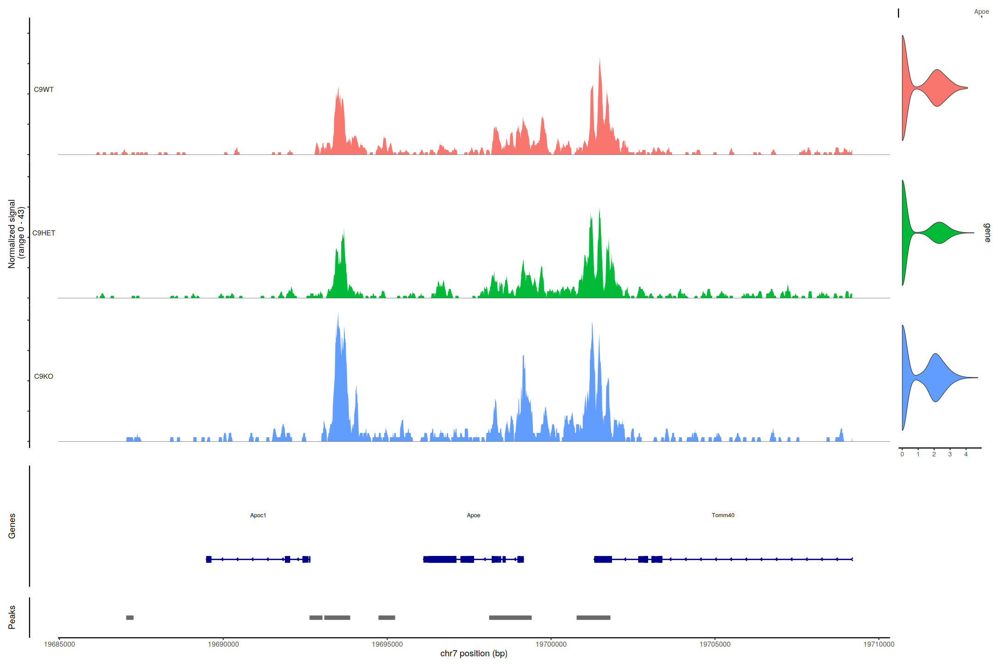

In [52]:
DefaultAssay(micro) <- 'peaks'
CoveragePlot(micro, region = 'chr7-19696109-19699188', group.by = 'genotype', extend.upstream = 10000, extend.downstream = 10000, features = 'Apoe')

In [7]:
calm = unique(grep("^Rab", deg_hippo$gene, value = T))
#camk = unique(grep("^Camk", deg_hippo$gene, value = T))
signatures <- list(Calm = c('Calm1', 'Calm2', 'Calm3'),
									 Camk = c('Camk1d','Camk2a'))
excit_subset <- subset(hippo, idents = c('CA1','CA2','CA3','DG'))
excit_subset <- AddModuleScore_UCell(excit_subset, features = signatures, name = NULL)

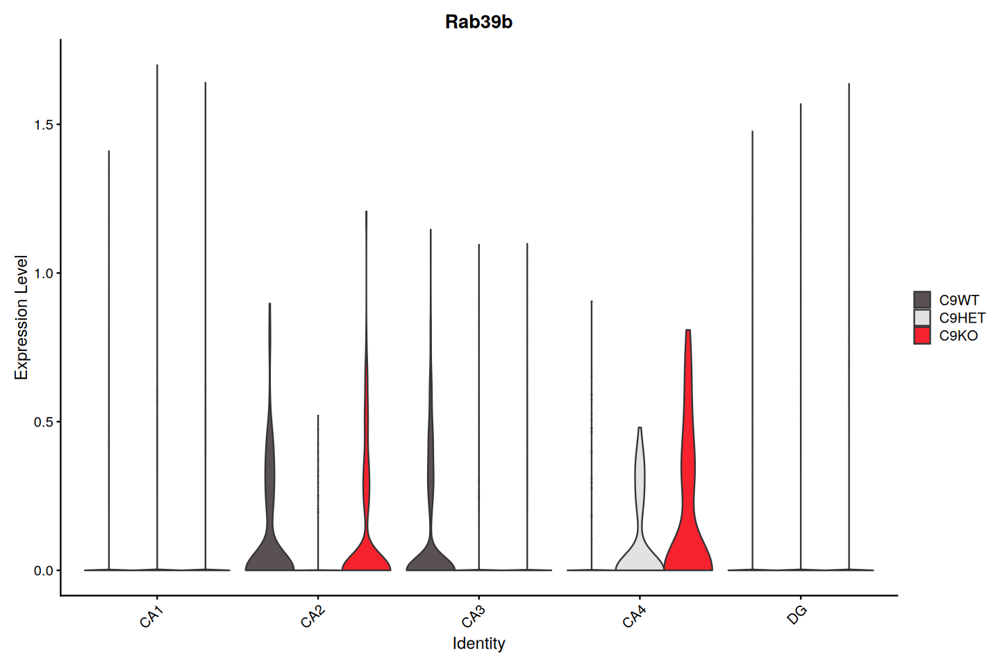

In [47]:
VlnPlot_scCustom(hippo, 'Rab39b', pt.size = 0, split.by = 'genotype', idents = c('CA1','CA2','CA3','CA4','DG'), )

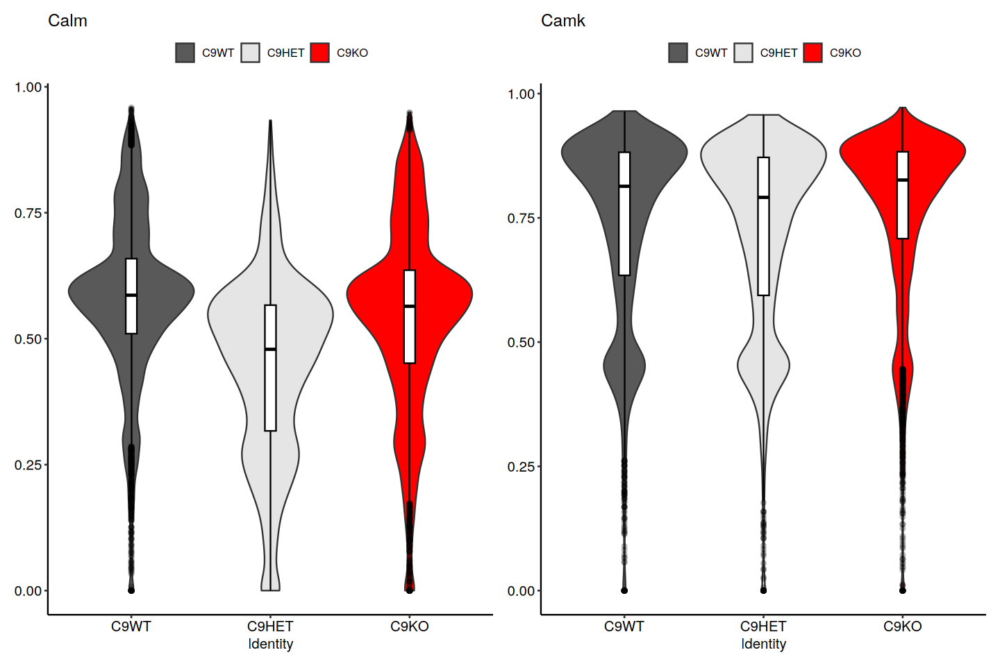

In [4]:
genotype_colours = c("#595959","#e5e5e5", "#ff0000")
VlnPlot_scCustom(excit_subset, features = names(signatures), group.by = 'genotype', colors_use = genotype_colours, pt.size = 0) & geom_boxplot(width = 0.08, color = 'black', fill = 'white', outlier.alpha = 0.2) & theme_pubr() & labs(x)

In [33]:
DefaultAssay(fctx) <- 'chromvar'
pdf('figures/mef2a_mef2c.pdf', width = 8, height = 4)
VlnPlot_scCustom(fctx, idents = 'L2/3 IT CTX', features = c('ENSMUSG00000030557-LINE1510-Mef2a-I','ENSMUSG00000005583-LINE1508-Mef2c-I'), pt.size = 0, group.by = 'genotype')& geom_boxplot(width = 0.08, color = 'black', fill = 'white', outlier.alpha = 0.2) & theme_pubr()
dev.off()

png 
  2

#### RNA UMAPs

In [11]:
p1 <- DimPlot_scCustom(hippo, group.by = 'class', colors_use = DiscretePalette_scCustomize(num_colors = length(unique(hippo$class)), palette = 'ditto_seq', shuffle_pal = T, seed = 1234), label = T) + theme_pubr(legend = 'bottom') + ggtitle(label = 'Hippocampus') + theme(plot.title=element_text(hjust=0.5))
p2 <- DimPlot_scCustom(fctx, group.by = 'subclass', colors_use = DiscretePalette_scCustomize(num_colors = length(unique(fctx$subclass)), palette = 'ditto_seq', shuffle_pal = T, seed = 5678), label = T) + theme_pubr(legend = 'bottom') + ggtitle(label = 'Frontal Cortex') + theme(plot.title=element_text(hjust=0.5))
p3 <- p1 & p2
pdf(file = 'figures/RNA_umaps.pdf', width = 12, height = 9)
p3
dev.off()

png 
  2

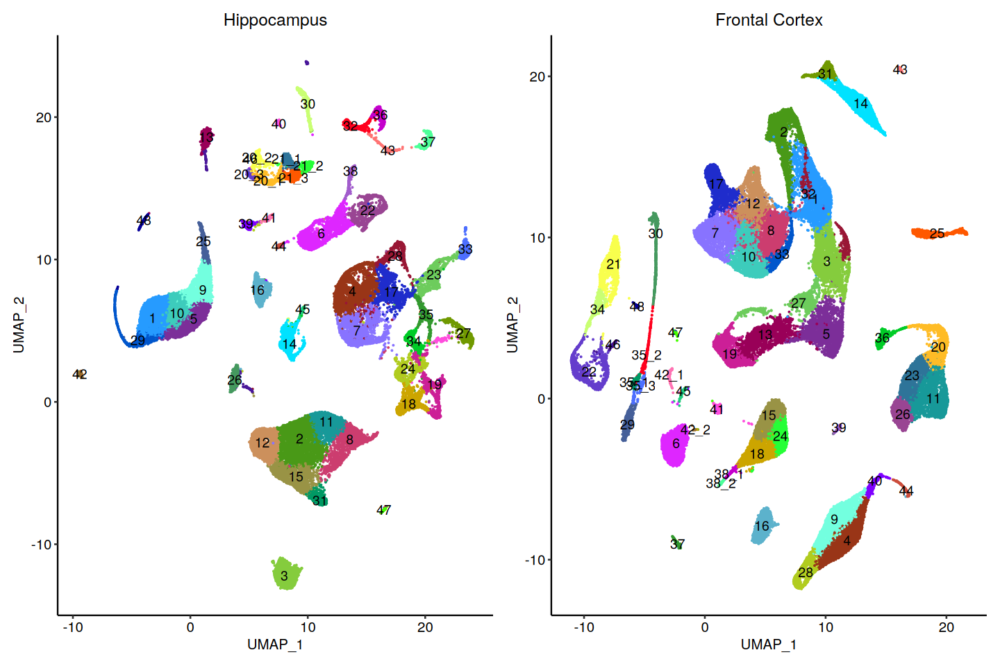

In [59]:
p1 <- DimPlot_scCustom(hippo, group.by = 'sub.cluster', label = T) + NoLegend() + ggtitle(label = 'Hippocampus') + theme_pubr(legend = 'none') + theme(plot.title=element_text(hjust=0.5))
p2 <- DimPlot_scCustom(fctx, group.by = 'sub.cluster', label = T) + NoLegend() + ggtitle(label = 'Frontal Cortex') + theme_pubr(legend = 'none') + theme(plot.title=element_text(hjust=0.5))
p1 & p2

#### Marker Heatmaps

In [12]:
runNSForest <- function(seu_obj, cluster_header = NULL, n_trees = 100L, n_genes_eval = 6L) {
	DefaultAssay(seu_obj) <- 'RNA'
	sc <- import("scanpy")
	sp <- import("scipy.sparse")
	sm <- import("scipy.io")
	nf <- import("nsforest")
    
	adata <- sc$AnnData(
		X   = t(GetAssayData(seu_obj, slot = 'counts')),
		obs = seu_obj[[]],
		var = GetAssay(seu_obj)[[]]
	)
	
	NSForest_results <-
		nf$NSForest(
			adata,
			cluster_header = cluster_header,
			n_trees = n_trees,
			n_genes_eval = n_genes_eval
		)
	return(NSForest_results)
}

markerHeatmap <- function(seu_obj, nsforest = NULL, ident) {
  if (is.null(nsforest)) {
    nsforest <- runNSForest(seu_obj, cluster_header = ident)
  }
	markers <- as.character(unlist(nsforest$NSForest_markers))
	DefaultAssay(seu_obj) <- 'RNA'
  mat <- as.matrix(AverageExpression(seu_obj, slot = 'data', assays = 'RNA', features = markers, group.by = ident)$RNA)
  mat <- mat[, order(colnames(mat))]
  clusters <- colnames(mat)
  mat <- apply(mat, 1, scale)
  rownames(mat) <- clusters
	
	# Heatmap parameters
	cell_fun <- function(j, i, x, y, width, height, fill) {
    grid.rect(x = x, y = y, width = width, height = height,
              gp = gpar(col = "black", fill = NA))
  }
	col_fun = circlize::colorRamp2(c(-1, 0, 2), viridis::viridis(n = 3))

  ComplexHeatmap::Heatmap(mat, name = "Expression",
		  									  heatmap_legend_param = list(border = "black"),
                          cluster_columns = FALSE,
                          cluster_rows = FALSE,
                          show_column_dend = FALSE,
                          show_row_dend = FALSE,
                          col = col_fun,
                          show_column_names = T,
                          use_raster = T,
                          border = T,
													cell_fun = cell_fun,
													column_title = "Marker Genes",
													column_title_side = "bottom",
        									row_title = "Cell Class",
													row_title_side = "right",
													row_title_rot = 270
                          )
}

p1 <- markerHeatmap(hippo, ident = 'class')
p2 <- markerHeatmap(fctx, ident = 'subclass')

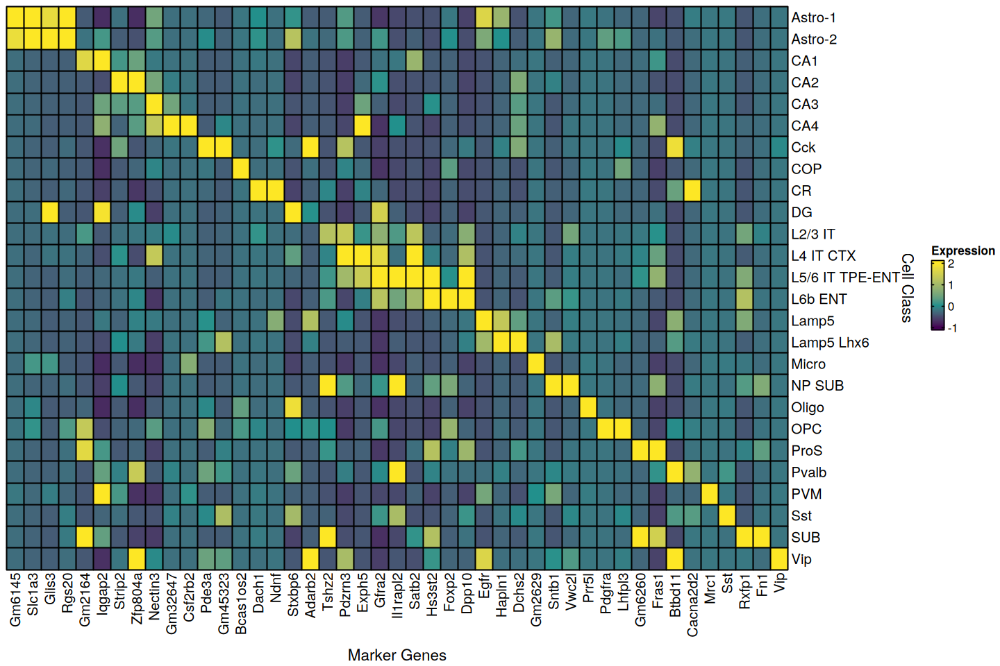

In [61]:
p1

In [29]:
fctx

[1] 4.996877

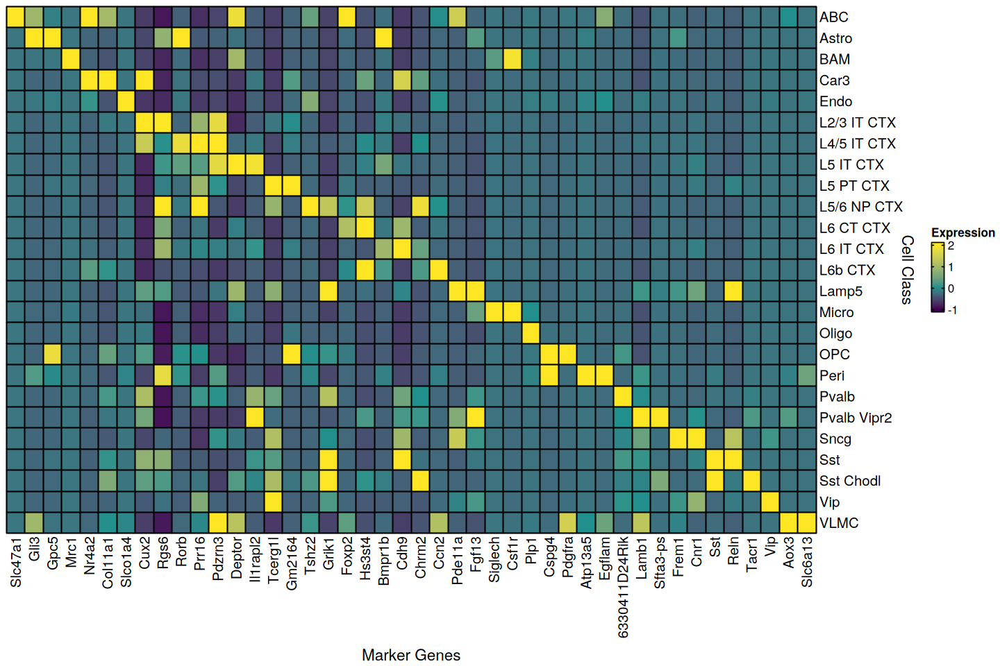

In [62]:
p2

In [21]:
table(fctx$orig.ident)


C9fctx 
 59629 

#### Cell Proportions

In [18]:
propPlot <- function(seu_obj, ident = NULL, group = NULL, seed) {
  dittoBarPlot(
    object = seu_obj,
    var = ident,
    group.by = group,
    color.panel =  DiscretePalette_scCustomize(num_colors = length(unique(seu_obj[[ident]][[ident]])), palette = 'ditto_seq', shuffle_pal = T, seed = seed),
    retain.factor.levels = T)  
}
pdf(file = 'figures/prop_plot.pdf', width = 4, height = 4)
propPlot(hippo, ident = 'class', group = 'sample', seed = 1234) + ggtitle("Hippocampus") + theme(plot.title = element_text(hjust = 0.5)) + labs(x = "Sample") + NoLegend()
dev.off()

png 
  2

In [20]:
pdf(file = 'figures/prop_plot_fctx.pdf', width = 4, height = 4)
propPlot(fctx, ident = 'subclass', group = 'sample', seed = 5678) + ggtitle("Frontal Cortex") + theme(plot.title = element_text(hjust = 0.5)) + labs(x = "Sample") + NoLegend()
dev.off()

png 
  2

### DEG

In [4]:
deg_fctx <- readRDS("C9Mouse_Frontal_Cortex/DEG/deg_master.rds")
deg_hippo <- readRDS("hippocampus_multiome_2024/DEG/deg_master.rds") %>%
  mutate(cluster = ifelse(cluster == "Astro-1", "Astro", cluster)) # Change for consistency between hippocampus and frontal cortex


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [10]:
print(deg_fctx[deg_fctx$cluster == 'L2/3 IT CTX' & abs(deg_fctx$avg_log2FC) > 0.3 & deg_fctx$p_val_adj < 0.05, ]$gene)

 [1] "Mid1"          "Slit2"         "Ldb2"          "Tafa1"        
 [5] "Homer1"        "Hecw2"         "Atp6v0c"       "Cck"          
 [9] "Mid1"          "Hspa8"         "Nrgn"          "Mical2"       
[13] "Itm2c"         "Calm2"         "Olfm1"         "Pak7"         
[17] "Ly6h"          "Adam23"        "Itm2b"         "Rtn1"         
[21] "Mlip"          "Ubb"           "Arc"           "Kcnj3"        
[25] "Bsg"           "Atp1b1"        "Hspa5"         "Tmtc1"        
[29] "Ywhah"         "Fkbp1a"        "Calm1"         "Baiap2"       
[33] "Pdp1"          "Hsp90b1"       "Pdia3"         "Cx3cl1"       
[37] "Ccnd2"         "Aldoa"         "Aplp1"         "Spred1"       
[41] "Tiparp"        "1700016P03Rik" "Tmem59l"       "Lamp5"        
[45] "Scn1a"         "Pak1"          "Camk2n1"       "Dscaml1"      
[49] "Gapdh"         "Ppia"          "Actb"          "Chgb"         
[53] "Grm3"          "Sik2"          "Hsp90ab1"      "Tuba1a"       
[57] "Slit2"         "Ckb"        

In [44]:
head(deg_hippo)

,gene,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,genotype,region
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,Aldoa,5.448581e-08,-0.7126671,0.260,0.421,0.001752263,Astro,C9HET,hippocampus
2,Rora,8.422081e-07,0.3511595,0.997,1.000,0.027085414,Astro,C9HET,hippocampus
3,Syt1,9.096072e-07,-0.6285002,0.089,0.246,0.029252967,Astro,C9HET,hippocampus
4,Tril,1.080000e-06,-0.6713367,0.241,0.405,0.034732797,Astro,C9HET,hippocampus
5,Ubc,1.911427e-06,-0.5836533,0.285,0.431,0.061471489,Astro,C9HET,hippocampus
6,Ppia,2.296197e-06,-0.5280673,0.569,0.713,0.073845682,Astro,C9HET,hippocampus


#### DEG Barplots

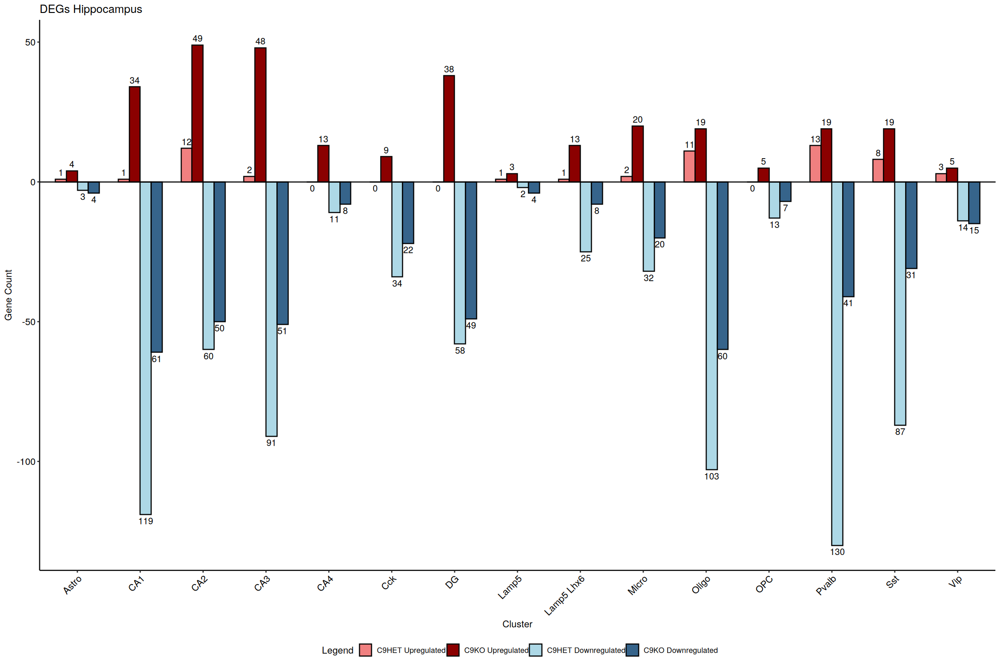

In [49]:
# Function to make barplot of DEG
deg_barplot <- function(deg, selected_clusters) {
	gene_counts <- deg %>%
		filter(cluster %in% selected_clusters) %>%
		mutate(expression = ifelse(avg_log2FC > 0, 'upregulated', 'downregulated')) %>%
		group_by(cluster, genotype, expression) %>%
		summarise(count = n(), .groups = 'drop') %>%
		pivot_wider(names_from = expression, values_from = count, values_fill = list(count = 0))
  
  # Ensure both upregulated and downregulated columns exist
  if (!"upregulated" %in% colnames(gene_counts)) {
    gene_counts <- gene_counts %>% mutate(upregulated = 0)
  }
  if (!"downregulated" %in% colnames(gene_counts)) {
    gene_counts <- gene_counts %>% mutate(downregulated = 0)
  }
  
  summary_counts <- gene_counts %>%
    group_by(cluster, genotype) %>%
    summarise(
      total_upregulated = sum(upregulated, na.rm = TRUE),
      total_downregulated = sum(downregulated, na.rm = TRUE),
      .groups = 'drop'
    )
  
  reshaped_counts <- summary_counts %>%
    pivot_longer(
      cols = c(total_upregulated, total_downregulated),
      names_to = "expression",
      values_to = "count"
    ) %>%
    mutate(regulation = ifelse(
      grepl("upregulated", expression, ignore.case = TRUE),
      "Upregulated",
      "Downregulated"
    ),
    count = ifelse(regulation == "Downregulated", -count, count),
    fill_color = case_when(
      genotype == "C9HET" & regulation == "Upregulated" ~ "lightcoral",
      genotype == "C9KO" & regulation == "Upregulated" ~ "red4",
			genotype == "C9HET" & regulation == "Downregulated" ~ "lightblue",
      genotype == "C9KO" & regulation == "Downregulated" ~ "steelblue4"
    ))
	reshaped_counts$fill_color <- factor(reshaped_counts$fill_color, 
                                     	 levels = c("lightcoral", "red4", "lightblue", "steelblue4"),
                                       labels = c("C9HET Upregulated", "C9KO Upregulated", "C9HET Downregulated", "C9KO Downregulated"))
  
  plot_combined <-
		ggplot(reshaped_counts, aes(
			x = cluster,
			y = count,
			fill = fill_color
		)) +
		geom_bar(stat = "identity", 
						position = position_dodge(width = 0.7), 
						width = 0.7,
						color = 'black') +
		geom_text(
			aes(label = abs(count)),
			position = position_dodge(width = 0.7),
			vjust = ifelse(reshaped_counts$count > 0, -0.5, 1.5),
			size = 4
		) +
		geom_hline(yintercept = 0) + 
		labs(x = "Cluster", y = "Gene Count", fill = "Legend") +
		theme_pubr(legend = "bottom") +
		scale_fill_manual(
			values = c("C9HET Upregulated" = "lightcoral", 
								"C9KO Upregulated" = "red4", 
								"C9HET Downregulated" = "lightblue", 
								"C9KO Downregulated" = "steelblue4")) + 
		theme(axis.text.x = element_text(angle = 45, hjust = 1))
	return(plot_combined)
}
deg_hippo_filt <- deg_hippo %>% filter(abs(avg_log2FC) > 0.3, p_val_adj < 0.05)
deg_barplot(deg_hippo_filt, c('Astro','CA1','CA2','CA3', 'CA4','Cck','CR','DG','L2/3 IT','L6b ENT', 'Lamp5','Lamp5 Lhx6', 'Micro','Oligo','OPC','Pvalb','Sst','SUB','Vip')) + ggtitle("DEGs Hippocampus")

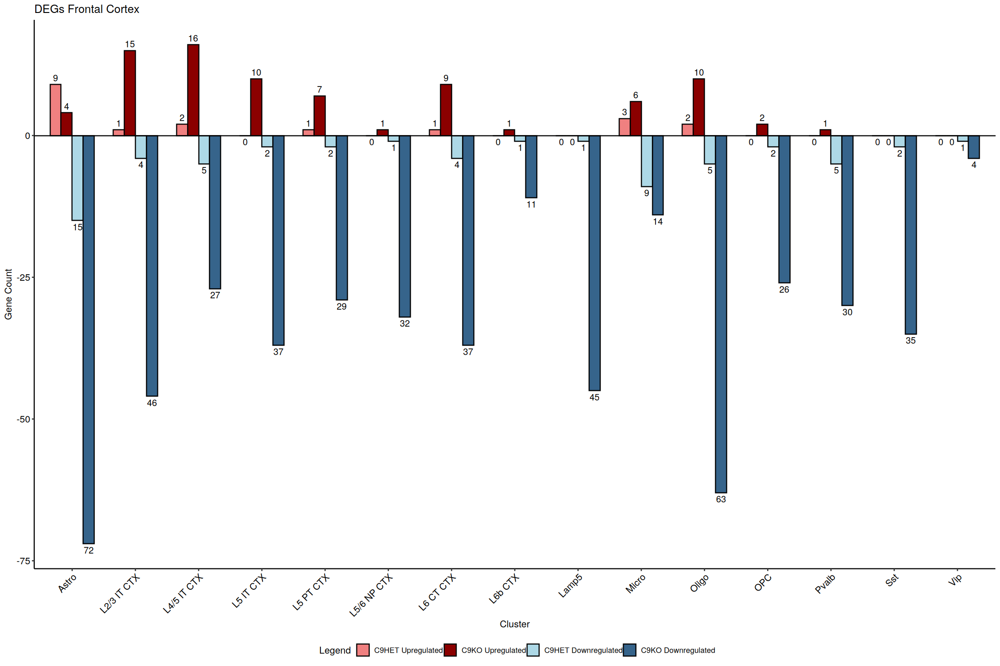

In [50]:
deg_fctx_filt <- deg_fctx %>% filter(abs(avg_log2FC) > 0.3, p_val_adj < 0.05)
deg_barplot(deg_fctx_filt, c('Astro','L2/3 IT CTX','L4/5 IT CTX','L5 IT CTX', 'L5 PT CTX','L5/6 NP CTX','L6 CT CTX','C6 IT CTX','L6b CTX','Lamp5','Micro','Oligo','OPC','Pvalb','Sst','Vip')) + ggtitle("DEGs Frontal Cortex")

In [12]:
pdf('figures/DEG_dar_fctx_glial.pdf', width = 12, height =8)
deg_barplot(deg_fctx_filt, c('Astro','Micro','Oligo','OPC')) + deg_barplot(fctx_df, c('Astro','Micro','Oligo','OPC')) & ylim(c(-160, 30))
dev.off()
pdf('figures/DEG_dar_hippo_glial.pdf', width = 12, height =8)
deg_barplot(deg_hippo_filt, c('Astro','Micro','Oligo','OPC')) + deg_barplot(hippo_df, c('Astro','Micro','Oligo','OPC')) & ylim(c(-160, 20))
dev.off()

png 
  2

png 
  2

#### LogFC Correlation Between Regions

`geom_smooth()` using formula = 'y ~ x'
Warning message:
"The following aesthetics were dropped during statistical transformation: fill.
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?"
`geom_smooth()` using formula = 'y ~ x'
Warning message:
"The following aesthetics were dropped during statistical transformation: fill.
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?"


[[1]]

[[2]]


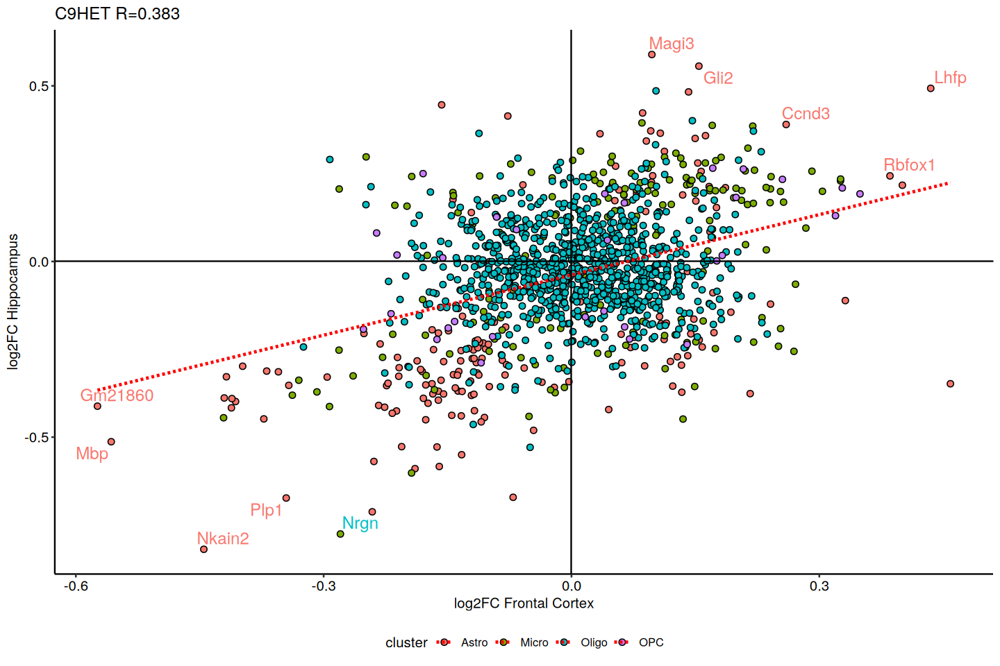

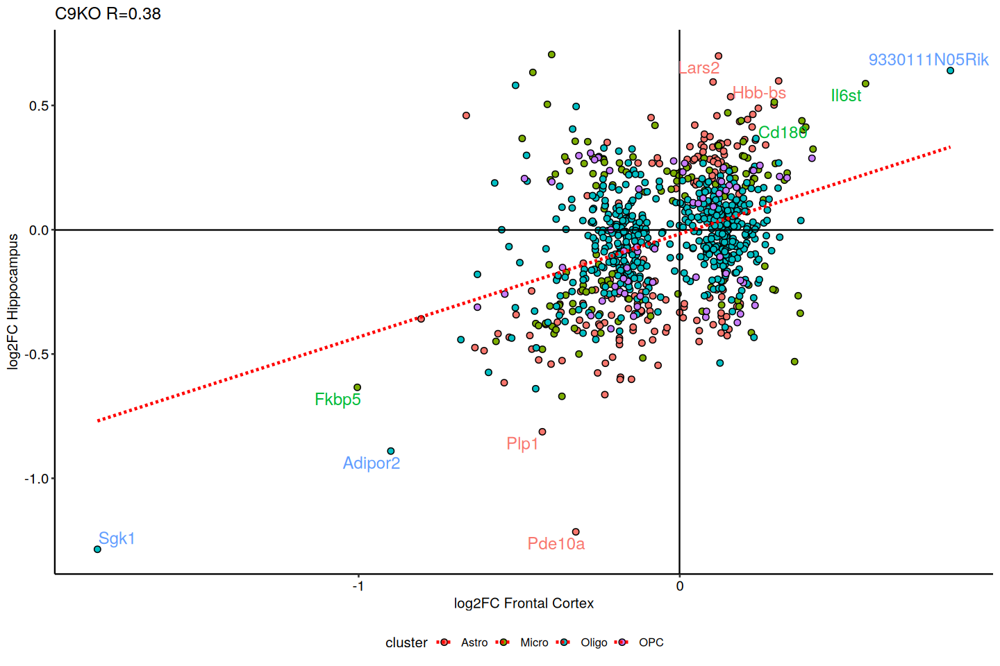

In [46]:
plot_logFC <- function(degs_1, degs_2, clusters) {
  # Make df with degs of clusters
  makeDF <- function(degs_1, degs_2, region) {
    # Define a function to extract avg_log2FC for a specific region
    extract_log2FC <- function(df, region_name, clusters) {
      df %>%
        filter(region == region_name, cluster %in% clusters, p_val < 0.05) %>%
        select(gene, genotype, avg_log2FC, cluster) %>%
        rename_with(~paste0("avg_log2FC_", region_name), avg_log2FC)
    }
    degs <- bind_rows(degs_1, degs_2)
    
    # Extract avg_log2FC for hippocampus and frontal cortex
    log2FC_hippo <- degs %>% extract_log2FC("hippocampus", clusters)
    log2FC_fctx <- degs %>% extract_log2FC("frontal cortex", clusters)
    
    # Merge the two dataframes
    result_df <- full_join(log2FC_hippo, log2FC_fctx, by = c("gene", "genotype", "cluster"))
    
    # Keep only one row per gene and genotype combination
    result_df <- result_df %>%
      distinct(gene, genotype, .keep_all = TRUE)
  
    return(result_df)
  }
  result_df <- makeDF(degs_1, degs_2, clusters) %>%
    na.omit()
  
  # Plotting function for each genotype
  plot_genotype <- function(data, genotype_label) {
    # Calculate correlation
    correlation <- cor(data$`avg_log2FC_frontal cortex`, data$avg_log2FC_hippocampus, use = "complete.obs")

		# Identify top 5 genes in the positive (+,+) and negative (-,-) quadrants
    top5_positive <- data %>% 
      filter(avg_log2FC_hippocampus > 0 & `avg_log2FC_frontal cortex` > 0) %>% 
      arrange(desc(avg_log2FC_hippocampus + `avg_log2FC_frontal cortex`)) %>% 
      head(5)
    
    top5_negative <- data %>% 
      filter(avg_log2FC_hippocampus < 0 & `avg_log2FC_frontal cortex` < 0) %>% 
      arrange(avg_log2FC_hippocampus + `avg_log2FC_frontal cortex`) %>% 
      head(5)
    
    label_genes <- bind_rows(top5_positive, top5_negative)
    
    # Create plot
    plot <- ggplot(data, aes(x = `avg_log2FC_frontal cortex`, y = avg_log2FC_hippocampus, fill = cluster)) +
      geom_point(size = 2, color = "black", pch = 21) +
      geom_hline(yintercept = 0, color = "black", linetype = "solid", size = 0.5) +
      geom_vline(xintercept = 0, color = "black", linetype = "solid", size = 0.5) +
      geom_smooth(method = "lm", se = FALSE, color = "red", linetype = "dashed", aes(group = 1)) +
      labs(x = "log2FC Frontal Cortex", y = "log2FC Hippocampus", color = "Celltype", 
           title = paste0(genotype_label, " R=", round(correlation, 3))) +
      theme_pubr(legend = "bottom") +
			geom_text_repel(data = label_genes, aes(label = gene, color = cluster), size = 5, force = 2, show.legend = F)

    
    return(plot)
  }

  # Filter data for each genotype and plot
  data_genotype1 <- result_df %>% filter(genotype == "C9HET")
  plot1 <- plot_genotype(data_genotype1, "C9HET")
  
  data_genotype2 <- result_df %>% filter(genotype == "C9KO")
  plot2 <- plot_genotype(data_genotype2, "C9KO")
  
  # Return both plots
  list(plot1, plot2)
}

plot_logFC(deg_fctx, deg_hippo, c("Astro", "Micro", "Oligo", "OPC"))

`geom_smooth()` using formula = 'y ~ x'
Warning message:
"The following aesthetics were dropped during statistical transformation: fill.
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?"
`geom_smooth()` using formula = 'y ~ x'
Warning message:
"The following aesthetics were dropped during statistical transformation: fill.
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?"


[[1]]

[[2]]


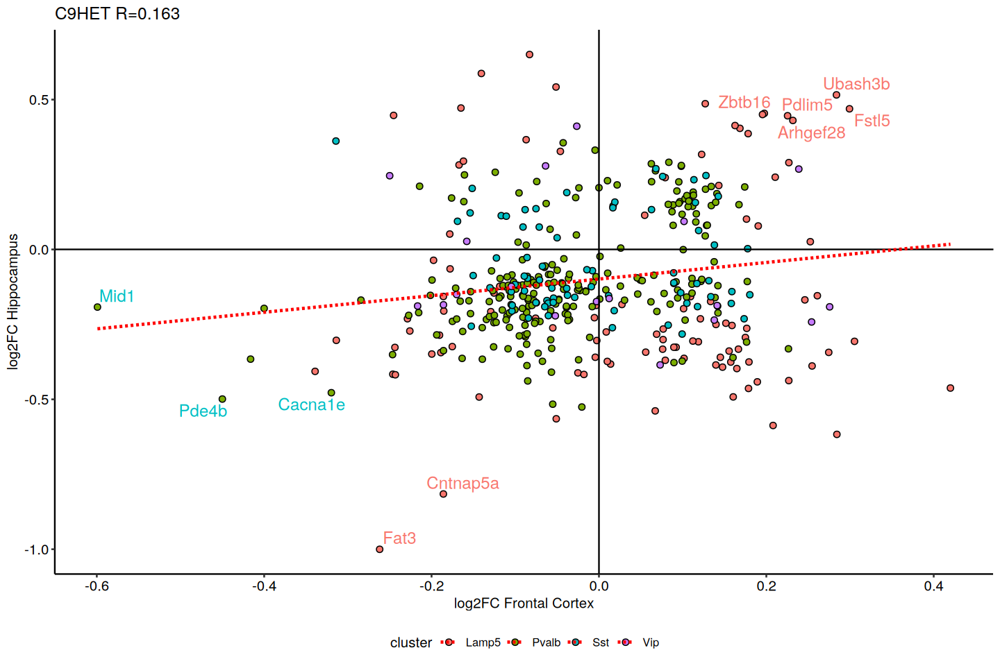

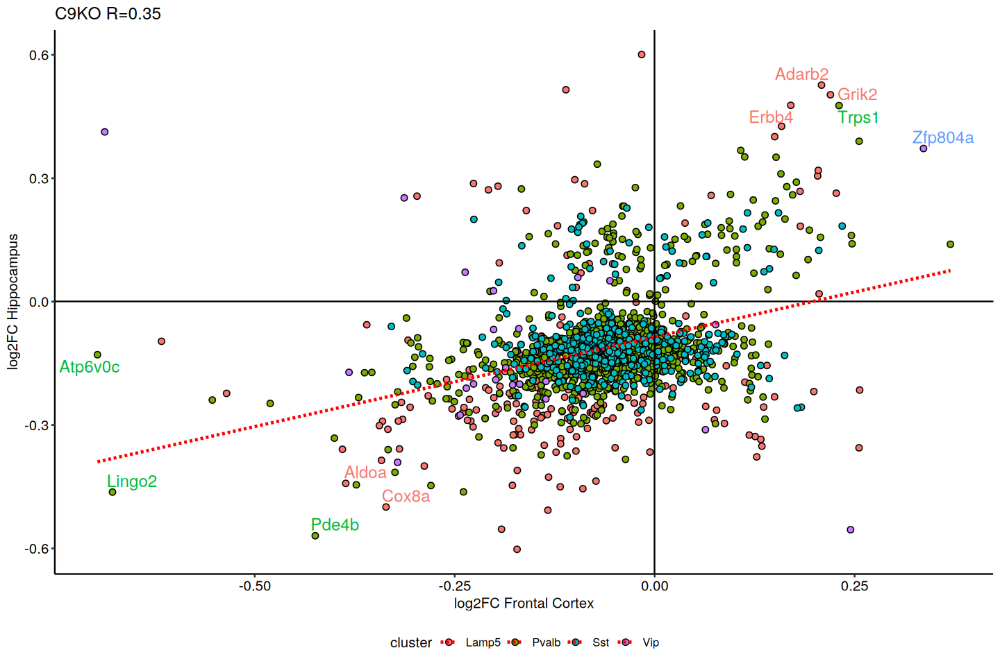

In [47]:
plot_logFC(deg_fctx, deg_hippo, c("Lamp5", "Pvalb", "Sst", "Vip"))

#### Plot LogFC Between Genotypes

`geom_smooth()` using formula = 'y ~ x'
Warning message:
"The following aesthetics were dropped during statistical transformation: fill.
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?"
`geom_smooth()` using formula = 'y ~ x'
Warning message:
"The following aesthetics were dropped during statistical transformation: fill.
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?"


[[1]]

[[2]]


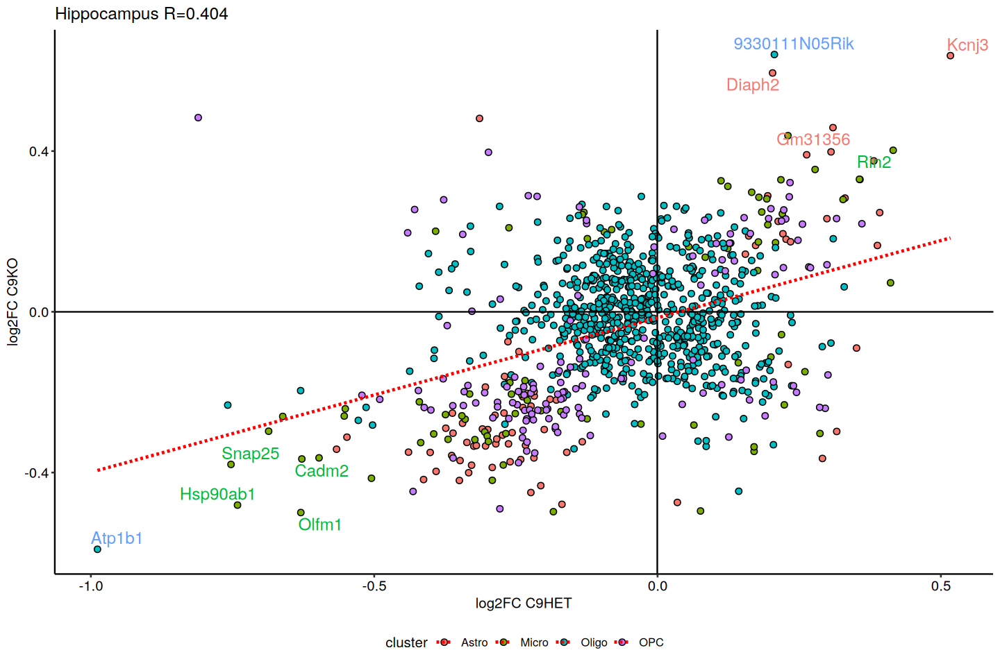

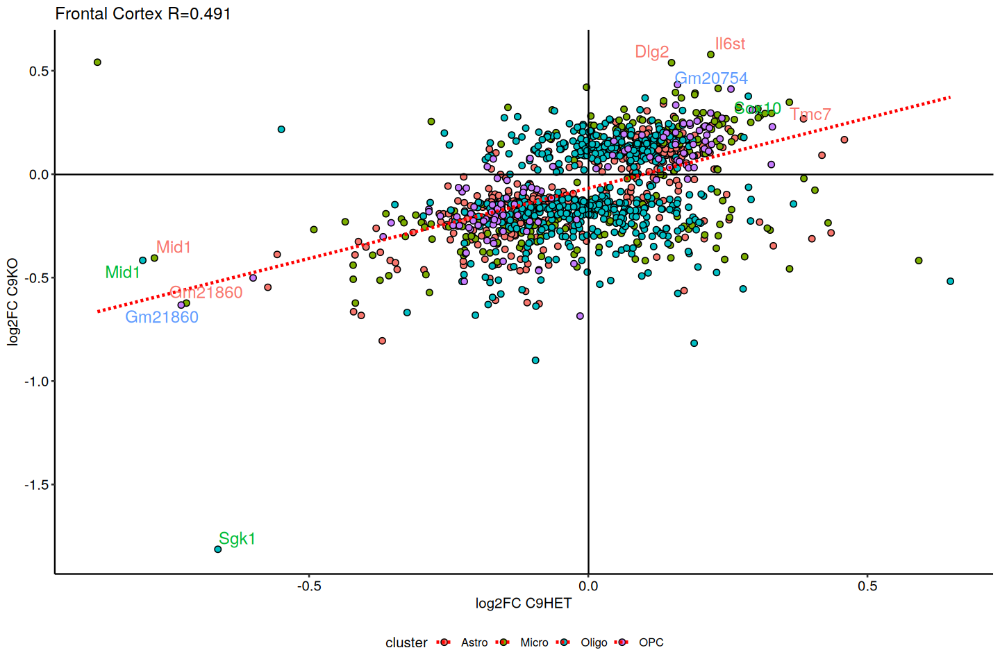

In [48]:
library(ggplot2)
library(ggrepel)
library(ggpubr)
library(dplyr)

plot_logFCGenotypes <- function(degs_1, degs_2, clusters) {
  # Make df with degs of clusters
  makeDF <- function(degs_1, degs_2, clusters) {
    # Define a function to extract avg_log2FC for a specific region
    extract_log2FC <- function(df, cond, clusters) {
      filtered_df <- df %>%
        filter(genotype == cond, cluster %in% clusters, p_val < 0.05) %>%
        select(gene, avg_log2FC, cluster, region)
      return(filtered_df)
    }
    
    # Combine degs_1 and degs_2
    degs <- bind_rows(degs_1, degs_2)
    
    # Extract avg_log2FC for both genotypes
    log2FC_C9HET <- extract_log2FC(degs, "C9HET", clusters) %>%
      dplyr::rename(avg_log2FC_C9HET = avg_log2FC)
    log2FC_C9KO <- extract_log2FC(degs, "C9KO", clusters) %>%
      dplyr::rename(avg_log2FC_C9KO = avg_log2FC)
    
    # Merge the two dataframes on gene, region, and cluster
    result_df <- full_join(log2FC_C9HET, log2FC_C9KO, by = c("gene", "region", "cluster"))
    
    # Keep only one row per gene and cluster combination
    result_df <- result_df %>%
      distinct(gene, cluster, .keep_all = TRUE)
  
    return(result_df)
  }
  
  result_df <- makeDF(degs_1, degs_2, clusters) %>%
    na.omit()
  
  # Plotting function for each region
  plot_genotype <- function(data, region_label) {
    # Calculate correlation
    correlation <- cor(data$avg_log2FC_C9HET, data$avg_log2FC_C9KO, use = "complete.obs")
    
    # Identify top 5 genes in the positive (+,+) and negative (-,-) quadrants
    top5_positive <- data %>% 
      filter(avg_log2FC_C9HET > 0 & avg_log2FC_C9KO > 0) %>% 
      arrange(desc(avg_log2FC_C9HET + avg_log2FC_C9KO)) %>% 
      head(5)
    
    top5_negative <- data %>% 
      filter(avg_log2FC_C9HET < 0 & avg_log2FC_C9KO < 0) %>% 
      arrange(avg_log2FC_C9HET + avg_log2FC_C9KO) %>% 
      head(5)
    
    label_genes <- bind_rows(top5_positive, top5_negative)
    
    # Create plot
    plot <- ggplot(data, aes(x = avg_log2FC_C9HET, y = avg_log2FC_C9KO, fill = cluster)) +
      geom_point(size = 2, color = "black", pch = 21) +
      geom_hline(yintercept = 0, color = "black", linetype = "solid", size = 0.5) +
      geom_vline(xintercept = 0, color = "black", linetype = "solid", size = 0.5) +
      geom_smooth(method = "lm", se = FALSE, color = "red", linetype = "dashed", aes(group = 1)) +
      labs(x = "log2FC C9HET", y = "log2FC C9KO", color = "Celltype", 
           title = paste0(region_label, " R=", round(correlation, 3))) +
      theme_pubr(legend = "bottom") +
			geom_text_repel(data = label_genes, aes(label = gene, color = cluster), size = 5, force = 2, show.legend = F)
    
    return(plot)
  }
  
  # Filter data for each region and plot
  data_hippocampus <- result_df %>% filter(region == "hippocampus")
  plot1 <- plot_genotype(data_hippocampus, "Hippocampus")
  
  data_frontal_cortex <- result_df %>% filter(region == "frontal cortex")
  plot2 <- plot_genotype(data_frontal_cortex, "Frontal Cortex")
  
  # Return both plots
  return(list(plot1, plot2))
}

# Example call to the function (use actual data frames for deg_fctx and deg_hippo)
plot_logFCGenotypes(deg_fctx, deg_hippo, c("Astro", "Micro", "Oligo", "OPC"))


`geom_smooth()` using formula = 'y ~ x'
Warning message:
"The following aesthetics were dropped during statistical transformation: fill.
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?"
`geom_smooth()` using formula = 'y ~ x'
Warning message:
"The following aesthetics were dropped during statistical transformation: fill.
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?"


[[1]]

[[2]]


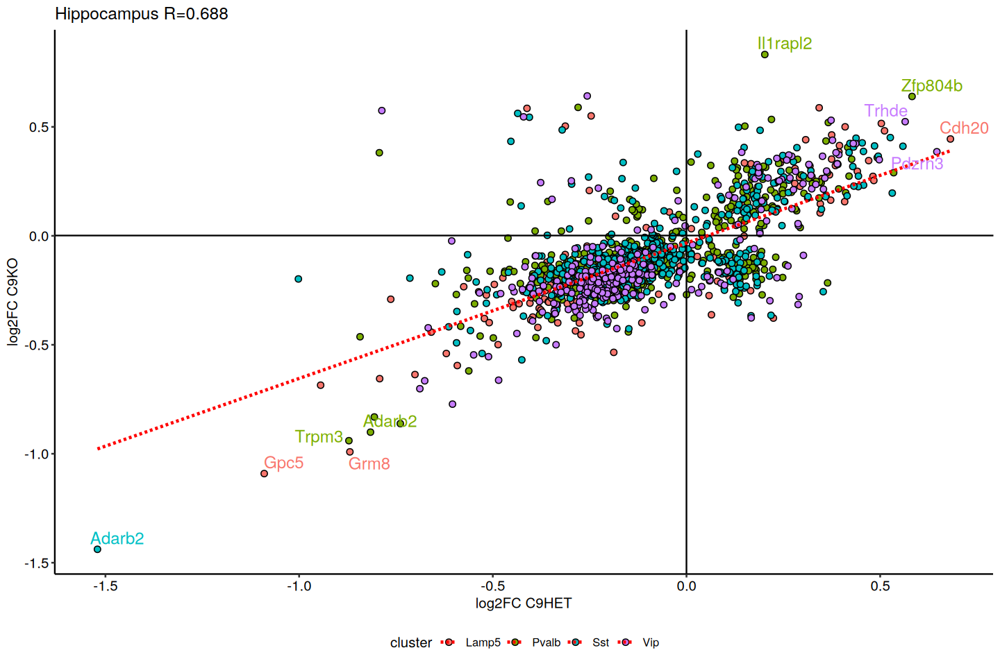

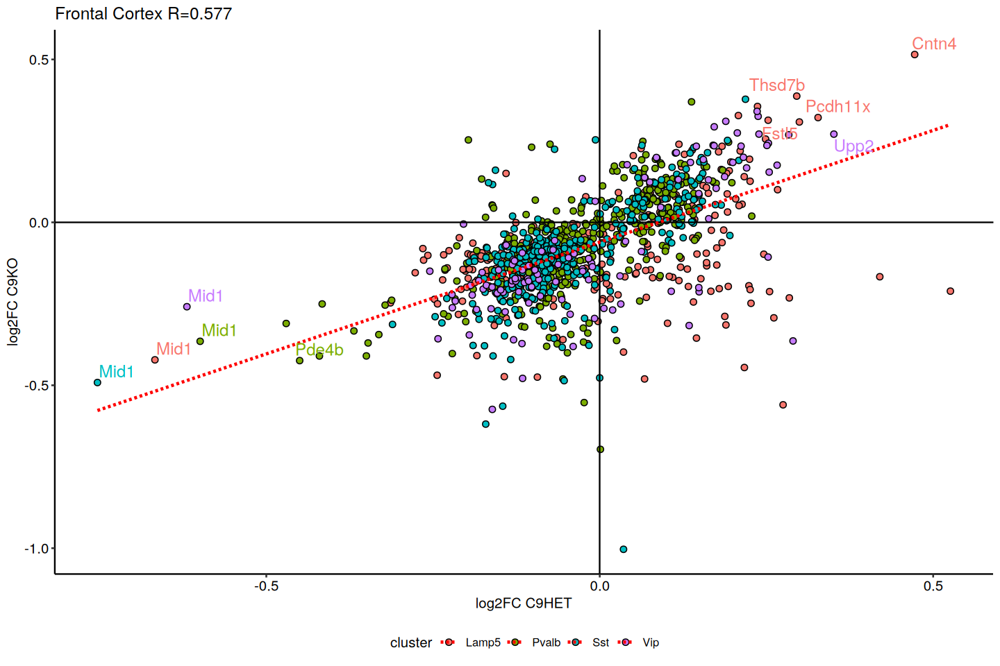

In [49]:
plot_logFCGenotypes(deg_fctx, deg_hippo, c("Lamp5", "Pvalb", "Sst", "Vip"))

`geom_smooth()` using formula = 'y ~ x'
Warning message:
"The following aesthetics were dropped during statistical transformation: fill.
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?"


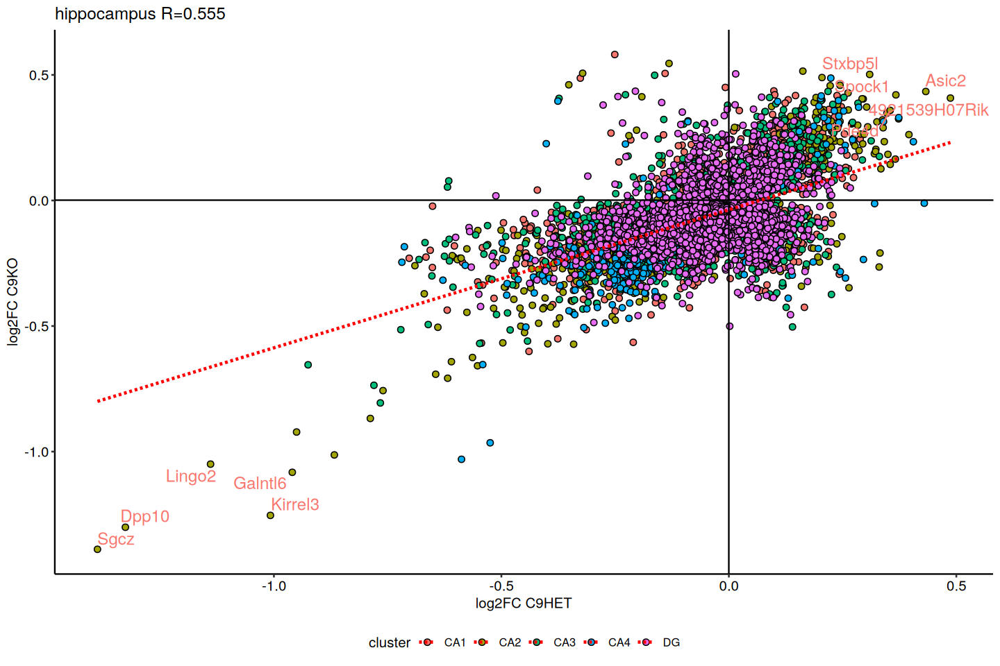

In [52]:
plot_logFCIndividual <- function(degs, clusters) {
  # Make df with degs of clusters
  makeDF <- function(degs, clusters) {
    # Define a function to extract avg_log2FC for a specific genotype
    extract_log2FC <- function(df, target_genotype, clusters) {
      df %>%
        dplyr::filter(genotype == target_genotype, cluster %in% clusters, p_val < 0.05) %>%
        dplyr::select(gene, genotype, avg_log2FC, cluster, region)
			}
    
    # Extract avg_log2FC for both genotypes
    log2FC_C9HET <- extract_log2FC(degs, "C9HET", clusters) %>%
      dplyr::rename(avg_log2FC_C9HET = avg_log2FC)
    log2FC_C9KO <- extract_log2FC(degs, "C9KO", clusters) %>%
      dplyr::rename(avg_log2FC_C9KO = avg_log2FC)
    
    # Merge the two dataframes on gene, region, and cluster
    result_df <- full_join(log2FC_C9HET, log2FC_C9KO, by = c("gene", "region", "cluster"))
    
    # Keep only one row per gene and cluster combination
    result_df <- result_df %>%
      distinct(gene, cluster, .keep_all = TRUE)
  
    return(result_df)
  }
  
  result_df <- makeDF(degs, clusters) %>%
    na.omit()
  
  # Plotting function
  plot_genotype <- function(data, region_label) {
    # Calculate correlation
    correlation <- cor(data$avg_log2FC_C9HET, data$avg_log2FC_C9KO, use = "complete.obs")
    
    # Identify top 5 genes in the positive (+,+) and negative (-,-) quadrants
    top5_positive <- data %>% 
      dplyr::filter(avg_log2FC_C9HET > 0 & avg_log2FC_C9KO > 0) %>% 
      dplyr::arrange(desc(avg_log2FC_C9HET + avg_log2FC_C9KO)) %>% 
      head(5)
    
    top5_negative <- data %>% 
      dplyr::filter(avg_log2FC_C9HET < 0 & avg_log2FC_C9KO < 0) %>% 
      dplyr::arrange(avg_log2FC_C9HET + avg_log2FC_C9KO) %>% 
      head(5)
    
    label_genes <- bind_rows(top5_positive, top5_negative)
    
    # Create plot
    plot <- ggplot(data, aes(x = avg_log2FC_C9HET, y = avg_log2FC_C9KO, fill = cluster)) +
      geom_point(size = 2, color = "black", pch = 21) +
      geom_hline(yintercept = 0, color = "black", linetype = "solid", size = 0.5) +
      geom_vline(xintercept = 0, color = "black", linetype = "solid", size = 0.5) +
      geom_smooth(method = "lm", se = FALSE, color = "red", linetype = "dashed", aes(group = 1)) +
      labs(x = "log2FC C9HET", y = "log2FC C9KO", color = "Celltype", 
           title = paste0(region_label, " R=", round(correlation, 3))) +
      theme_pubr(legend = "bottom") +
      geom_text_repel(data = label_genes, aes(label = gene, color = cluster), size = 5, show.legend = F)
    return(plot)
  }
  
  # dplyr::Filter data for the region and plot
  unique_regions <- unique(result_df$region)
  plots <- list()
  
  for (region in unique_regions) {
    data_region <- result_df %>% dplyr::filter(region == !!region)
    plots[[region]] <- plot_genotype(data_region, region)
  }
  
  # Return all plots
  return(plots)
}
plot_logFCIndividual(deg_hippo, c("CA1","CA2","CA3","CA4","DG"))[[1]]

`geom_smooth()` using formula = 'y ~ x'
Warning message:
"The following aesthetics were dropped during statistical transformation: fill.
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?"


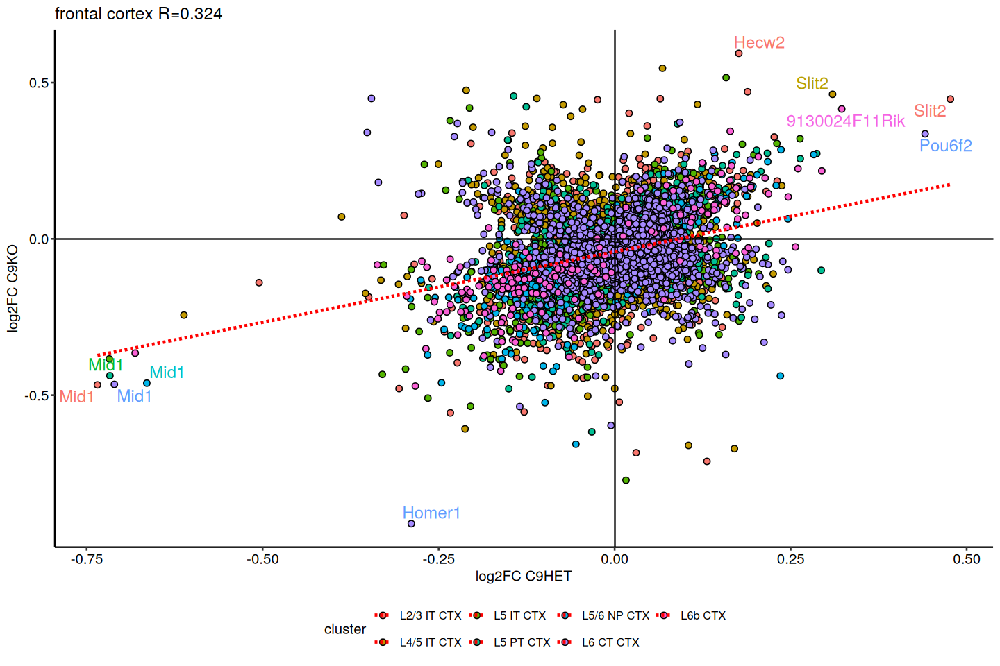

In [51]:
plot_logFCIndividual(deg_fctx, c('L2/3 IT CTX','L4/5 IT CTX','L5 IT CTX', 'L5 PT CTX','L5/6 NP CTX','L6 CT CTX','C6 IT CTX','L6b CTX'))[[1]]

#### Volcano Plots

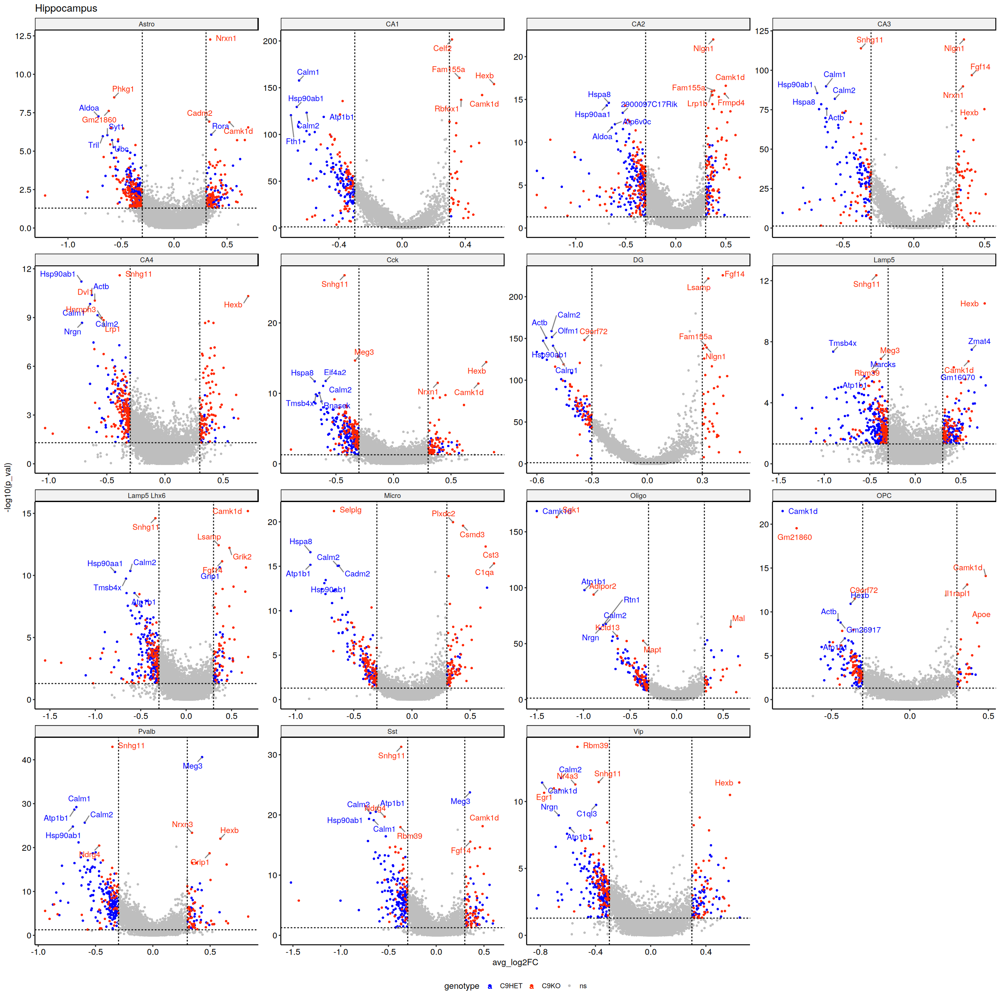

In [49]:
options(repr.plot.width = 20, repr.plot.height = 20)
volcano_plot <- function(collapsed_data) {
    p <- ggplot(collapsed_data, aes(x = avg_log2FC, y = -log10(p_val), color = genotype)) +
        rasterise(geom_point(aes(color = ifelse(abs(avg_log2FC) <= 0.3 | -log10(p_val) < 1.3, "ns", genotype)),
                             size = 0.75), dpi = 300) +
        labs(x = "avg_log2FC",
             y = "-log10(p_val)") +
        theme_pubr(legend = "bottom") +
        facet_wrap(~cluster, scales = "free") +
        scale_color_manual(values = c("blue", "#ff2600", "grey")) +
        geom_vline(xintercept = c(-0.3, 0.3), linetype = "dashed", color = "black", linewidth = 0.5) +
        geom_hline(yintercept = -log10(0.05), linetype = "dashed", color = "black", linewidth = 0.5)
    
    # Adding labels for the top genes within each cluster facet
    for (clust in unique(collapsed_data$cluster)) {
        subset_data <- filter(collapsed_data, cluster == clust)
        
        top_genes_C9HET <- subset_data %>%
            filter(genotype == "C9HET") %>%
            slice_max(order_by = ifelse(abs(avg_log2FC) > 0.3 & -log10(p_val) > 1.3, -log10(p_val), -Inf), n = 5) %>%
            ungroup()
        
        top_genes_C9KO <- subset_data %>%
            filter(genotype == "C9KO") %>%
            slice_max(order_by = ifelse(abs(avg_log2FC) > 0.3 & -log10(p_val) > 1.3, -log10(p_val), -Inf), n = 5) %>%
            ungroup()
        
        p <- p +
            geom_text_repel(data = top_genes_C9HET,
                            aes(label = gene),
                            box.padding = 0.5,
                            segment.color = 'grey50',
                            force = 2) +
            geom_text_repel(data = top_genes_C9KO,
                            aes(label = gene),
                            box.padding = 0.5,
                            segment.color = 'grey50',
                            force = 2)
    }
    
    return(p)
}
volcano_plot(deg_hippo) + ggtitle("Hippocampus")

Warning message:
"ggrepel: 10134 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 9860 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


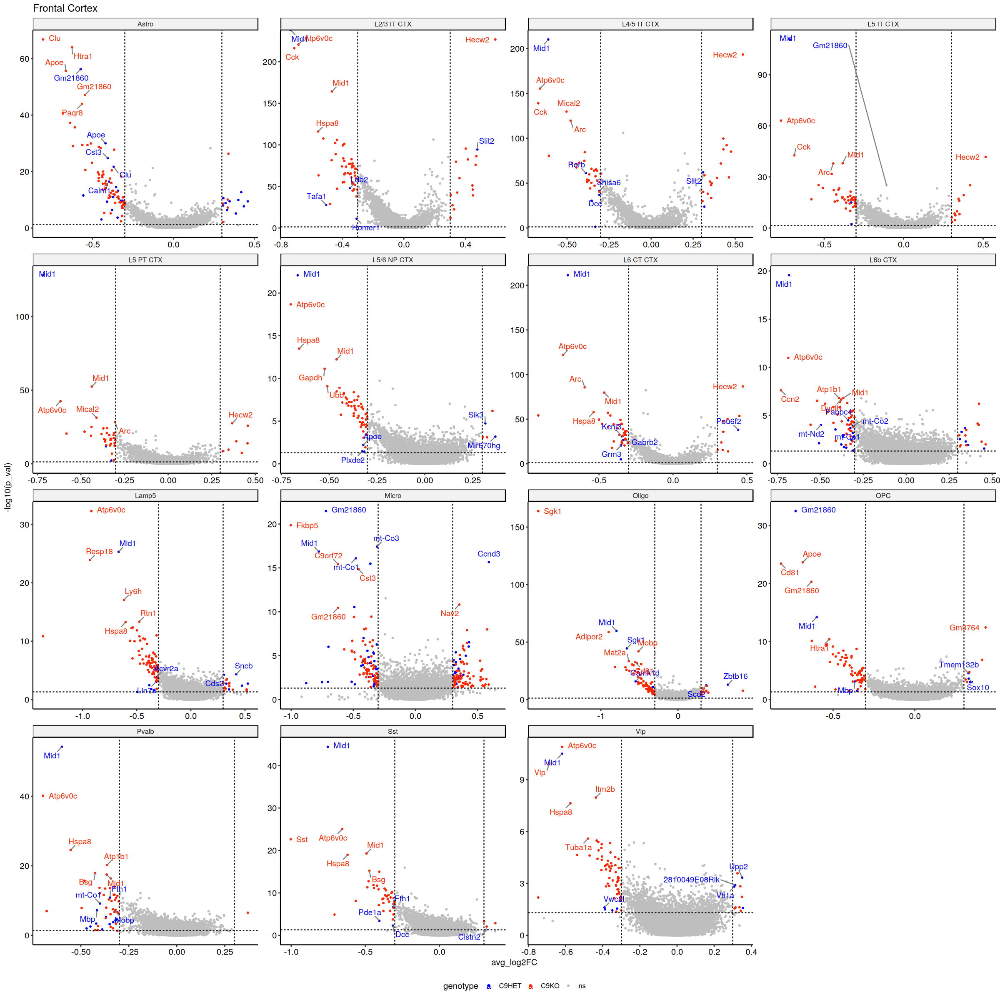

In [50]:
deg_fctx_filt <- deg_fctx %>% filter(cluster %in% c('Astro','L2/3 IT CTX','L4/5 IT CTX','L5 IT CTX', 'L5 PT CTX','L5/6 NP CTX','L6 CT CTX','C6 IT CTX','L6b CTX','Lamp5','Micro','Oligo','OPC','Pvalb','Sst','Vip'))
volcano_plot(deg_fctx_filt) + ggtitle("Frontal Cortex")

In [54]:
pdf("figures/volcano_fctx.pdf", width = 8, height = 8)
volcano_plot(deg_fctx_filt[deg_fctx_filt$cluster == c('Lamp5','Pvalb','Sst','Vip'), ]) + ggtitle("Frontal Cortex")
dev.off()

Warning message:
"ggrepel: 2262 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 2253 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 1915 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


png 
  2

In [55]:
pdf("figures/volcano_hippo.pdf", width = 12, height = 9)
volcano_plot(deg_hippo[deg_hippo$cluster == c('Cck','Lamp5', 'Lamp5 Lhx6', 'Pvalb','Sst','Vip'), ]) + ggtitle("Hippocampus")
dev.off()

Warning message in deg_hippo$cluster == c("Cck", "Lamp5", "Lamp5 Lhx6", "Pvalb", :
"longer object length is not a multiple of shorter object length"


png 
  2

In [63]:
deg_hippo$genotype

[1] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
   [10] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
   [19] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
   [28] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
   [37] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
   [46] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
   [55] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
   [64] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
   [73] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
   [82] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
   [91] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [100] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [109] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [118] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [127] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [136] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [145] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [154] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [163] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [172] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [181] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [190] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [199] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [208] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [217] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [226] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [235] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [244] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [253] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [262] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [271] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [280] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [289] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [298] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [307] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [316] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [325] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [334] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [343] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [352] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [361] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [370] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [379] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [388] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [397] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [406] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [415] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [424] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [433] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [442] "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET" "C9HET"
  [4

In [71]:
pdf(file = "figures/inhibitory_degs.pdf", width = 4, height = 4)
ggvenn(list(`Frontal Cortex` =deg_fctx_filt[deg_fctx_filt$cluster == c('Lamp5','Pvalb','Sst','Vip') & abs(deg_fctx_filt$avg_log2FC) > 0.3 & deg_fctx_filt$p_val_adj < 0.05 & deg_fctx_filt$genotype == 'C9KO', ]$gene,
						`Hippocampus` = deg_hippo[deg_hippo$cluster == c('Lamp5', 'Lamp5 Lhx6', 'Pvalb','Sst','Vip') & abs(deg_hippo$avg_log2FC) > 0.3 & deg_hippo$p_val_adj < 0.05 & deg_hippo$genotype == 'C9HET', ]$gene))
dev.off()

png 
  2

In [72]:
intersect(deg_fctx_filt[deg_fctx_filt$cluster == c('Lamp5') & abs(deg_fctx_filt$avg_log2FC) > 0.3 & deg_fctx_filt$p_val_adj < 0.05 & deg_fctx_filt$genotype == 'C9KO', ]$gene,
					deg_hippo[deg_hippo$cluster == c('Lamp5', 'Lamp5 Lhx6') & abs(deg_hippo$avg_log2FC) > 0.3 & deg_hippo$p_val_adj < 0.05 & deg_hippo$genotype == 'C9HET', ]$gene)

[1] "Atp6v0c" "Hspa8"   "Aldoa"

In [80]:
pdf(file = "figures/inhibitory_Pvalb_degs.pdf", width = 4, height = 4)
ggvenn(list(`Frontal Cortex` =deg_fctx_filt[deg_fctx_filt$cluster == c('Pvalb') & abs(deg_fctx_filt$avg_log2FC) > 0.3 & deg_fctx_filt$p_val_adj < 0.05 & deg_fctx_filt$genotype == 'C9KO', ]$gene,
						`Hippocampus` = deg_hippo[deg_hippo$cluster == c('Pvalb') & abs(deg_hippo$avg_log2FC) > 0.3 & deg_hippo$p_val_adj < 0.05 & deg_hippo$genotype == 'C9HET', ]$gene))
dev.off()

png 
  2

In [76]:
intersect(deg_fctx_filt[deg_fctx_filt$cluster == c('Pvalb') & abs(deg_fctx_filt$avg_log2FC) > 0.3 & deg_fctx_filt$p_val_adj < 0.05 & deg_fctx_filt$genotype == 'C9KO', ]$gene,
					deg_hippo[deg_hippo$cluster == c('Pvalb') & abs(deg_hippo$avg_log2FC) > 0.3 & deg_hippo$p_val_adj < 0.05 & deg_hippo$genotype == 'C9HET', ]$gene)

[1] "Atp6v0c"  "Hspa8"    "Atp1b1"   "Bsg"      "Ubb"      "Hsp90ab1"
 [7] "Pcsk1n"   "Gapdh"    "Ppia"     "Rab3a"    "Ckb"      "Cox8a"   
[13] "Lingo2"   "Tmsb4x"   "Cck"      "Calm1"

In [81]:
pdf(file = "figures/inhibitory_Sst_degs.pdf", width = 4, height = 4)
ggvenn(list(`Frontal Cortex` =deg_fctx_filt[deg_fctx_filt$cluster == c('Sst') & abs(deg_fctx_filt$avg_log2FC) > 0.3 & deg_fctx_filt$p_val_adj < 0.05 & deg_fctx_filt$genotype == 'C9KO', ]$gene,
						`Hippocampus` = deg_hippo[deg_hippo$cluster == c('Sst') & abs(deg_hippo$avg_log2FC) > 0.3 & deg_hippo$p_val_adj < 0.05 & deg_hippo$genotype == 'C9HET', ]$gene))
dev.off()

png 
  2

In [77]:
intersect(deg_fctx_filt[deg_fctx_filt$cluster == c('Sst') & abs(deg_fctx_filt$avg_log2FC) > 0.3 & deg_fctx_filt$p_val_adj < 0.05 & deg_fctx_filt$genotype == 'C9KO', ]$gene,
					deg_hippo[deg_hippo$cluster == c('Sst') & abs(deg_hippo$avg_log2FC) > 0.3 & deg_hippo$p_val_adj < 0.05 & deg_hippo$genotype == 'C9HET', ]$gene)

[1] "Atp6v0c"  "Hspa8"    "Atp1b1"   "Aldoa"    "Slc25a4"  "Nsg1"    
 [7] "Rnasek"   "Calm2"    "Ppia"     "Tuba1a"   "Itm2c"    "Rtn1"    
[13] "Ndufc2"   "Hsp90aa1" "Hsp90ab1"

In [82]:
pdf(file = "figures/inhibitory_Vip_degs.pdf", width = 4, height = 4)
ggvenn(list(`Frontal Cortex` =deg_fctx_filt[deg_fctx_filt$cluster == c('Vip') & abs(deg_fctx_filt$avg_log2FC) > 0.3 & deg_fctx_filt$p_val_adj < 0.05 & deg_fctx_filt$genotype == 'C9KO', ]$gene,
						`Hippocampus` = deg_hippo[deg_hippo$cluster == c('Vip') & abs(deg_hippo$avg_log2FC) > 0.3 & deg_hippo$p_val_adj < 0.05 & deg_hippo$genotype == 'C9HET', ]$gene))
dev.off()

png 
  2

In [79]:
intersect(deg_fctx_filt[deg_fctx_filt$cluster == c('Vip') & abs(deg_fctx_filt$avg_log2FC) > 0.3 & deg_fctx_filt$p_val_adj < 0.05 & deg_fctx_filt$genotype == 'C9KO', ]$gene,
				  deg_hippo[deg_hippo$cluster == c('Vip') & abs(deg_hippo$avg_log2FC) > 0.3 & deg_hippo$p_val_adj < 0.05 & deg_hippo$genotype == 'C9HET', ]$gene)

[1] "Atp6v0c"

#### DEG Heatmap

In [1]:
# Make heatmaps with this
degHeatmap <- function(fctx, hip, assay, degs, region, cluster, n_genes, genotype_colours) {
  # Helper function to order DEGs by adjusted p-value and select top n genes for a given genotype
  deg_order <- function(degs, n_genes, cond) {
    out <- degs %>%
      dplyr::filter(genotype == cond, abs(avg_log2FC) > 0.3) %>%
      arrange(p_val_adj) %>%
      slice_head(n = n_genes) %>%
      pull(gene)
    return(out)
  }
  
  # Helper function to generate heatmap plots
  generate_heatmap_plot <- function(data, genes, main_title, cluster_cols = FALSE, genotype_colours) {
    p <- dittoHeatmap(data[genes, ], show_colnames = TRUE, slot = 'data',
                      main = main_title, border_color = 'black', cluster_cols = cluster_cols,
                      cellheight = 11, cellwidth = 11, annot.by = c('genotype', 'sex'),
                      annot.colors = c(genotype_colours, 'steelblue1', 'orange1'), # WT, C9-HET, C9-KO, then sex
                      heatmap.colors = c('blue','white','red'), complex = T)
    return(p)
  }
  
  # Define sex and genotype order based on region
  if (region == 'hippocampus') {
    sex <- c('Female', 'Male', 'Male', 'Female', 'Male', 'Female', 'Female', 'Male', 'Male', 'Male', 'Female', 'Female')
    genotype <- c("WT", "WT", "WT", "WT",
                  "C9-HET", "C9-HET", "C9-HET", "C9-HET",
                  "C9-KO", "C9-KO", "C9-KO", "C9-KO")
    region_sub <- subset(hip, idents = cluster)
  } else {
    sex <- c('Male', 'Male', 'Female', 'Female', 'Female', 'Female', 'Female', 'Female', 'Male', 'Male', 'Male', 'Male', 'Female', 'Female')
    genotype <- c("WT", "WT", "WT", "WT", "WT",
                  "C9-HET", "C9-HET", "C9-HET", "C9-HET", "C9-HET",
                  "C9-KO", "C9-KO", "C9-KO", "C9-KO")
    region_sub <- subset(fctx, idents = cluster)
  }
  
  # Filter DEGs for the specific region and cluster
  degs_sub <- degs %>% 
    dplyr::filter(cluster == cluster)
  # Get top DEGs for C9HET and C9KO
  degs_region_het <- deg_order(degs_sub, n_genes = n_genes, cond = 'C9HET')
	print(degs_region_het)
  degs_region_ko <- deg_order(degs_sub, n_genes = n_genes, cond = 'C9KO')
  print(degs_region_ko)
  # Calculate average expression for the subset region
  Idents(region_sub) <- 'sample'
  avgexp_region_sub <- AverageExpression(region_sub, 
                                         assays = assay, 
                                         features = unique(c(degs_region_het, degs_region_ko)), 
                                         slot = 'data', 
                                         return.seurat = TRUE)
  avgexp_region_sub$sample <- Idents(avgexp_region_sub)
  
  # Rename identities based on genotype and sex
  names(genotype) <- levels(avgexp_region_sub)
  avgexp_region_sub <- RenameIdents(avgexp_region_sub, genotype)
  avgexp_region_sub$genotype <- Idents(avgexp_region_sub)
  
  Idents(avgexp_region_sub) <- 'sample'
  names(sex) <- levels(avgexp_region_sub)
  avgexp_region_sub <- RenameIdents(avgexp_region_sub, sex)
  avgexp_region_sub$sex <- Idents(avgexp_region_sub)
  
  # Generate heatmap plots for C9HET and C9KO
  p1 <- generate_heatmap_plot(avgexp_region_sub, 
                              degs_region_het, 
                              paste(region, cluster, 'C9-HET'),
															genotype_colours = genotype_colours)
  p2 <- generate_heatmap_plot(avgexp_region_sub,
                              degs_region_ko,
                              paste(region, cluster, 'C9-KO'),
															genotype_colours = genotype_colours)
  
  return(list(C9HET = p1, C9KO = p2))
}


degHeatmapSubset <- function(fctx, hip, assay, degs_vector, region, clusters, n_genes, genotype_colours) {
  generate_heatmap_plot <- function(data, genes, main_title, cluster_cols = FALSE, genotype_colours) {
    p <- dittoHeatmap(data[genes, ], show_colnames = TRUE, slot = 'data',
                      main = main_title, border_color = 'black', cluster_cols = cluster_cols,
                      cellheight = 11, cellwidth = 11, annot.by = c('genotype', 'sex'),
                      annot.colors = c(genotype_colours, 'steelblue1', 'orange1'), # WT, C9-HET, C9-KO, then sex
                      heatmap.colors = c('blue','white','red'), complex = T)
    return(p)
  }
	# Define sex and genotype order based on region
  if (region == 'hippocampus') {
    sex <- c('Female', 'Male', 'Male', 'Female', 'Male', 'Female', 'Female', 'Male', 'Male', 'Male', 'Female', 'Female')
    genotype <- c("WT", "WT", "WT", "WT",
                  "C9-HET", "C9-HET", "C9-HET", "C9-HET",
                  "C9-KO", "C9-KO", "C9-KO", "C9-KO")
    region_sub <- subset(hip, idents = clusters)
  } else {
    sex <- c('Male', 'Male', 'Female', 'Female', 'Female', 'Female', 'Female', 'Female', 'Male', 'Male', 'Male', 'Male', 'Female', 'Female')
    genotype <- c("WT", "WT", "WT", "WT", "WT",
                  "C9-HET", "C9-HET", "C9-HET", "C9-HET", "C9-HET",
                  "C9-KO", "C9-KO", "C9-KO", "C9-KO")
    region_sub <- subset(fctx, idents = clusters)
  }
	# Calculate average expression for the subset region
  Idents(region_sub) <- 'sample'
  avgexp_region_sub <- AverageExpression(region_sub, 
                                         assays = assay, 
                                         features = unique(degs), 
                                         slot = 'data', 
                                         return.seurat = TRUE)
  avgexp_region_sub$sample <- Idents(avgexp_region_sub)
	p1 <- generate_heatmap_plot(avgexp_region_sub, 
															unique(degs), 
															paste(region, clusters),
															genotype_colours = genotype_colours)
}

degHeatmapCombined <- function(fctx, hip, assay, degs_vector, region, cluster, n_genes, genotype_colours) {
  # Helper function to order DEGs_vector by adjusted p-value and select top n genes for a given genotype
  deg_order <- function(degs_vector, n_genes, cond) {
    out <- degs_vector %>%
      dplyr::filter(genotype == cond, abs(avg_log2FC) > 0.3) %>%
      arrange(p_val_adj) %>%
      slice_head(n = n_genes) %>%
      pull(gene)
    return(out)
  }
  
  # Helper function to generate heatmap plots
  generate_heatmap_plot <- function(data, genes, main_title, cluster_cols = FALSE, genotype_colours) {
    p <- dittoHeatmap(data[genes, ], show_colnames = TRUE, slot = 'data',
                      main = main_title, border_color = 'black', cluster_cols = cluster_cols,
                      cellheight = 11, cellwidth = 11, annot.by = c('genotype', 'sex'),
                      annot.colors = c(genotype_colours, 'steelblue1', 'orange1'), # WT, C9-HET, C9-KO, then sex
                      heatmap.colors = c('blue','white','red'), complex = T)
    return(p)
  }
  
  # Define sex and genotype order based on region
  if (region == 'hippocampus') {
    sex <- c('Female', 'Male', 'Male', 'Female', 'Male', 'Female', 'Female', 'Male', 'Male', 'Male', 'Female', 'Female')
    genotype <- c("WT", "WT", "WT", "WT",
                  "C9-HET", "C9-HET", "C9-HET", "C9-HET",
                  "C9-KO", "C9-KO", "C9-KO", "C9-KO")
    region_sub <- subset(hip, idents = cluster)
  } else {
    sex <- c('Male', 'Male', 'Female', 'Female', 'Female', 'Female', 'Female', 'Female', 'Male', 'Male', 'Male', 'Male', 'Female', 'Female')
    genotype <- c("WT", "WT", "WT", "WT", "WT",
                  "C9-HET", "C9-HET", "C9-HET", "C9-HET", "C9-HET",
                  "C9-KO", "C9-KO", "C9-KO", "C9-KO")
    region_sub <- subset(fctx, idents = cluster)
  }
  
  # Filter DEGs_vector for the specific region and cluster
  degs_vector_sub <- degs_vector %>% 
    dplyr::filter(cluster == cluster)
  
  # Get top DEGs for C9HET and C9KO
  degs_vector_region_het <- deg_order(degs_vector_sub, n_genes = n_genes, cond = 'C9HET')
  degs_vector_region_ko <- deg_order(degs_vector_sub, n_genes = n_genes, cond = 'C9KO')
  
  # Combine DEGs from both genotypes
  combined_degs <- unique(c(degs_vector_region_het, degs_vector_region_ko))
  
  # Calculate average expression for the subset region
  Idents(region_sub) <- 'sample'
  avgexp_region_sub <- AverageExpression(region_sub, 
                                         assays = assay, 
                                         features = combined_degs, 
                                         slot = 'data', 
                                         return.seurat = TRUE)
  avgexp_region_sub$sample <- Idents(avgexp_region_sub)
  
  # Rename identities based on genotype and sex
  names(genotype) <- levels(avgexp_region_sub)
  avgexp_region_sub <- RenameIdents(avgexp_region_sub, genotype)
  avgexp_region_sub$genotype <- Idents(avgexp_region_sub)
  
  Idents(avgexp_region_sub) <- 'sample'
  names(sex) <- levels(avgexp_region_sub)
  avgexp_region_sub <- RenameIdents(avgexp_region_sub, sex)
  avgexp_region_sub$sex <- Idents(avgexp_region_sub)
  
  # Generate a single heatmap plot for combined DEGs
  p <- generate_heatmap_plot(avgexp_region_sub, 
                             combined_degs, 
                             paste(region, cluster, 'Combined C9-HET & C9-KO'),
                             genotype_colours = genotype_colours)
  
  return(p)
}

In [31]:
selected_clusters_fctx = c('L2/3 IT CTX','L4/5 IT CTX','L5 IT CTX','L5 PT CTX','L5/6 NP CTX','L6 CT CTX','L6 IT CTX','L6b CTX')
degHeatmap(fctx = fctx, hip = hippo, assay = 'peaks', degs = hippo_df, region = 'hippocampus', cluster = 'Oligo', n_genes = 100, genotype_colours = genotype_colours)$C9KO

ERROR: [1m[33mError[39m in `pull()`:[22m
[33m![39m Can't extract column with `!!enquo(var)`.
[31m✖[39m `!!enquo(var)` must be numeric or character, not a <standardGeneric> object.


### GO plot

In [86]:
nlib_fctx <- readRDS('C9Mouse_Frontal_Cortex/GO_analysis/nlib.rds')
nlib_hip <- readRDS('hippocampus_multiome_2024/GO_analysis/nlib.rds')

In [ ]:
nlib_fctx

: 

In [87]:
# Make a master GO:BP dataframe (all clusters, genotypes, and regulation)
process_nlib <- function(nlib) {
  map_dfr(names(nlib), ~ {
    cluster_name <- .x
    map_dfr(names(nlib[[cluster_name]]), ~ {
      genotype <- .x
      map_dfr(names(nlib[[cluster_name]][[genotype]]), ~ {
        regulation <- .x
        result <- nlib[[cluster_name]][[genotype]][[regulation]]@result
        result <- mutate(result, regulation = regulation, genotype = genotype, cluster = cluster_name)
        result
      })
    })
  })
}

fctx_godf <- process_nlib(nlib_fctx)
hippo_godf <- process_nlib(nlib_hip)

In [95]:
generateGOHeatmap <- function(fctx_godf, hippo_godf, min_count, n_slice, selected_clusters) {
  # Define the aggregate_matrix function
  aggregateMatrix <- function(matrix) {
    rownames_split <- strsplit(rownames(matrix), "\\.")
    unique_rownames <- unique(sapply(rownames_split, `[`, 1))
    matrix_unique <- sapply(unique_rownames, function(name) {
      rows <- which(sapply(rownames_split, `[`, 1) == name)
      colSums(matrix[rows, , drop = FALSE], na.rm = TRUE)
    })
    matrix_unique <- t(matrix_unique)
    rownames(matrix_unique) <- unique_rownames
    colnames(matrix_unique) <- colnames(matrix)
    return(matrix_unique)
  }
  
  extractAnnotation <- function(colname) {
    parts <- unlist(strsplit(colname, "_"))
    return(c(region = parts[1], cluster = parts[2], genotype = parts[3]))
  }
  
  # Combine and process the data
  combined_df <- bind_rows(fctx_godf %>% mutate(region = 'frontal cortex'), 
                           hippo_godf %>% mutate(region = 'hippocampus') %>% 
                             mutate(cluster = gsub('Astro-1','Astro', cluster)))
  
  processed_df <- combined_df %>%
    dplyr::filter(Count >= min_count, cluster %in% selected_clusters) %>%
    mutate(log_p_adjust = -log10(p.adjust), row_id = row_number()) %>%
    group_by(cluster, genotype, regulation) %>%
    arrange(desc(log_p_adjust)) %>%
    slice_head(n = n_slice) %>%
    ungroup() %>%
    dplyr::select(Description, genotype, log_p_adjust, regulation, cluster, row_id, region) %>%
    spread(key = genotype, value = log_p_adjust) %>%
    pivot_longer(cols = c(het, ko), names_to = "value_type", values_to = "value") %>%
    unite("region_cluster", region, cluster, value_type) %>%
    pivot_wider(names_from = region_cluster, values_from = value)
  
  # Create matrices for upregulated and downregulated data
  upregulated <- processed_df %>% dplyr::filter(regulation == "upregulated") %>% replace(is.na(.), 0)
  downregulated <- processed_df %>% dplyr::filter(regulation == "downregulated") %>% replace(is.na(.), 0)
  
  up_matrix <- as.matrix(upregulated[, 4:ncol(upregulated)])
  rownames(up_matrix) <- upregulated$Description
  up_matrix <- aggregateMatrix(up_matrix)
  
  down_matrix <- as.matrix(downregulated[, 4:ncol(downregulated)])
  rownames(down_matrix) <- downregulated$Description
  down_matrix <- aggregateMatrix(down_matrix)
  
  combined_matrix <- rbind(up_matrix, down_matrix)
  # Define row and column splits for visualization
  row_split <- c(rep("upregulated", nrow(up_matrix)), rep("downregulated", nrow(down_matrix)))
  column_split <- gsub("_.*", "", colnames(combined_matrix))
  col_fun <- colorRamp2(c(min(combined_matrix, na.rm = T), max(combined_matrix, na.rm = T)), c("white", "red"))
  
  annotation_row <- as.matrix(data.frame(regulation = row_split))
  annotation_colors <- list(regulation = c(upregulated = "orange2", downregulated = "skyblue"))
  rownames(annotation_row) <- rownames(combined_matrix)
  
  row_annotation <- rowAnnotation(df = annotation_row, col = annotation_colors,
                                  annotation_legend_param = list(border = T),
                                  simple_anno_size = unit(0.3, "cm"), 
                                  gp = gpar(col = "black"),
                                  show_annotation_name = F)
  
  # Create column annotations
  column_annotation_data <- as.data.frame(do.call(rbind, lapply(colnames(combined_matrix), extractAnnotation)))
  column_annotation_data[] <- lapply(column_annotation_data, as.character)
  column_annotation_data$cluster <- factor(column_annotation_data$cluster)
  column_annotation_data$genotype <- gsub('het','C9-HET', column_annotation_data$genotype)
  column_annotation_data$genotype <- gsub('ko','C9-KO', column_annotation_data$genotype)
  
  
  column_annotation <- HeatmapAnnotation(
    df = column_annotation_data,
    col = list(
      region = c('frontal cortex' = 'springgreen2', 'hippocampus' = 'mediumvioletred'),
      cluster = setNames(scCustomize::DiscretePalette_scCustomize(num_colors = length(levels(column_annotation_data$cluster)), palette = 'ditto_seq', shuffle_pal = T),
                         levels(column_annotation_data$cluster)),
      genotype = c("C9-HET" = "#e5e5e5", "C9-KO" = "#ff0000")
    ),
    annotation_legend_param = list(border = T),
    simple_anno_size = unit(0.3, "cm"),
    gp = gpar(col = "black")
  )
  
  # Custom column text
  column_labels <- paste(column_annotation_data$cluster, column_annotation_data$genotype)
  # Create the heatmap
  heatmap <- Heatmap(combined_matrix,
                     name = "-log10pvalue", 
                     row_split = row_split, 
                     column_split = column_split,
                     show_row_names = TRUE, 
                     show_column_names = TRUE, 
                     cluster_rows = TRUE, 
                     cluster_columns = T,
                     col = col_fun, 
                     cell_fun = function(j, i, x, y, width, height, fill) {
                       grid.rect(x = x, y = y, width = width, height = height, gp = gpar(col = "black", fill = NA))
                     }, 
                     column_title = NULL,
                     left_annotation = row_annotation,
                     top_annotation = column_annotation,
                     heatmap_legend_param = list(border = T),
                     row_names_gp = gpar(fontsize = 10),
                     column_names_gp = gpar(fontsize = 10),
                     column_labels = column_labels)
  
  # Draw the heatmap
  draw(heatmap, heatmap_legend_side = "right", annotation_legend_side = "right")
}
generateGOHeatmap(fctx_godf, hippo_godf, min_count = 5, n_slice = 4, selected_clusters = c('L2/3 IT CTX','L4/5 IT CTX','L5 IT CTX', 'L5 PT CTX','L5/6 NP CTX','L6 CT CTX','C6 IT CTX','L6b CTX', 'CA1','CA2','CA3','CA4','DG'))

Warning message:
"`df` should be a data frame while not a matrix. Convert it to data
frame."


In [97]:
pdf('figures/inhibitory_go.pdf', width = 14, height = 12)
generateGOHeatmap(fctx_godf, hippo_godf, 4, n_slice = 3, selected_clusters = c('Cck','Lamp5','Pvalb','Sst', 'Vip'))
dev.off()

Warning message:
"`df` should be a data frame while not a matrix. Convert it to data
frame."


png 
  2

Warning message:
"`df` should be a data frame while not a matrix. Convert it to data
frame."


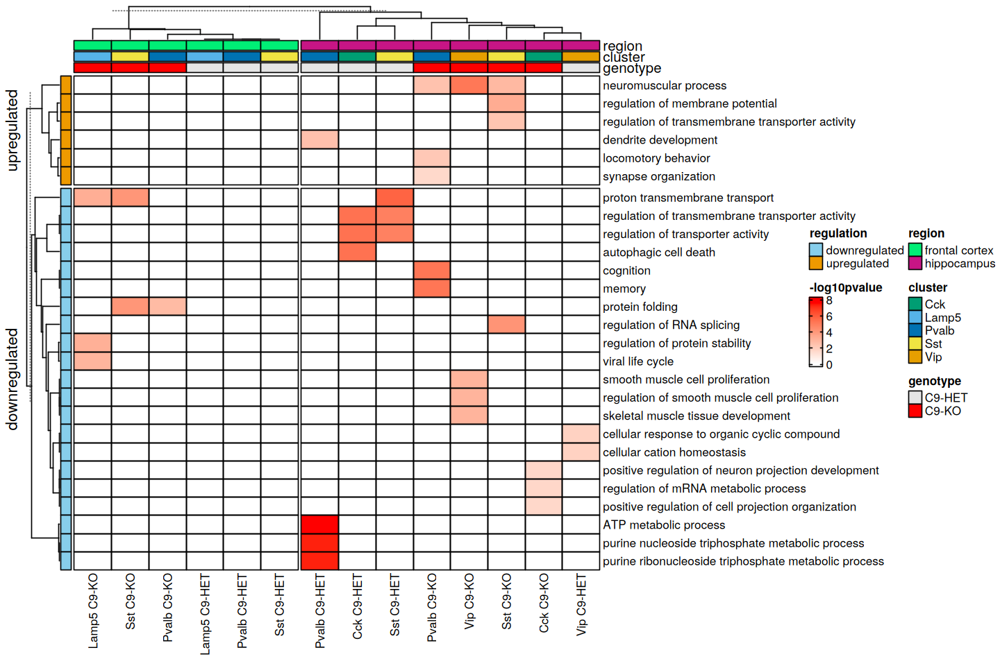

In [35]:
generateGOHeatmap(fctx_godf, hippo_godf, 4, n_slice = 3, selected_clusters = c('Cck','Lamp5','Pvalb','Sst', 'Vip'))

## ATAC

### UMAP using MACS2 peaks

In [13]:
p1 <- DimPlot_scCustom(hippo, group.by = 'class', reduction = 'umap.peaks', colors_use = DiscretePalette_scCustomize(num_colors = length(unique(hippo$class)), palette = 'ditto_seq', shuffle_pal = T, seed = 1234), label = T) + theme_pubr(legend = 'bottom') + ggtitle(label = 'Hippocampus') + theme(plot.title=element_text(hjust=0.5))
p2 <- DimPlot_scCustom(fctx, group.by = 'subclass', reduction = 'umap.peaks', colors_use = DiscretePalette_scCustomize(num_colors = length(unique(fctx$subclass)), palette = 'ditto_seq', shuffle_pal = T, seed = 5678), label = T) + theme_pubr(legend = 'bottom') + ggtitle(label = 'Frontal Cortex') + theme(plot.title=element_text(hjust=0.5))
p3 <- p1 & p2
p3 <- p1 & p2
pdf(file = 'figures/ATAC_umaps.pdf', width = 12, height = 9)
p3
dev.off()

png 
  2

### Correlation between RNA and peaks

Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.0 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.0 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.6 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.6 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.7 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.7 GiB"
`geom_smooth()` using formula = 'y ~ x'
Warning message:
"Removed 180425 rows containing non-finite outside the scale range
(`stat_smooth()`)."
Warning message:
"Removed 180425 rows containing non-finite outside the scale range
(`stat_cor()`)."
Warning message:
"Removed 180425 rows containing missing values or values outside the scale range
(`geom_point()`)."


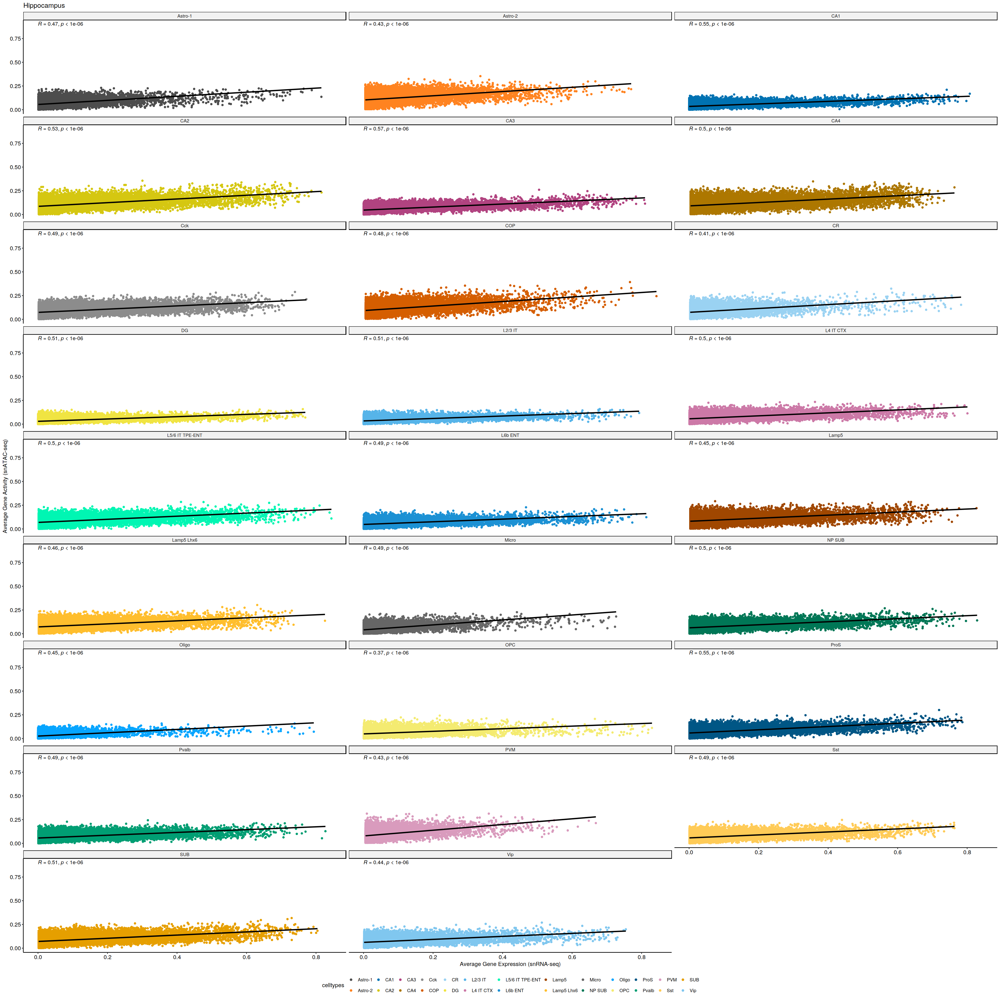

In [8]:

corrMultiome <- function(seu_obj, region, n_col_legend) {
    if (region == "hippocampus") {
        Idents(seu_obj) <- 'class'
        colors_use = DiscretePalette_scCustomize(num_colors = length(unique(hippo$class)), palette = 'ditto_seq', shuffle_pal = TRUE, seed = 1234)
    } else {
        Idents(seu_obj) <- 'subclass'
        colors_use = DiscretePalette_scCustomize(num_colors = length(unique(fctx$subclass)), palette = 'ditto_seq', shuffle_pal = TRUE, seed = 5678)
    }
    
    celltype <- levels(seu_obj)
    exp_mat <- GetAssayData(seu_obj, slot='data', assay='RNA')
    acc_mat <- GetAssayData(seu_obj, slot='data', assay='GAM')

    genes.use <- intersect(rownames(acc_mat), rownames(exp_mat))
    exp_mat <- exp_mat[genes.use, ]
    acc_mat <- acc_mat[genes.use, ]
    stopifnot(all.equal(rownames(exp_mat), rownames(acc_mat)))

    df <- data.frame()
    for (cur_celltype in celltype) {
        if (region == 'hippocampus') {
            cur_exp_mat <- exp_mat[, seu_obj$class == cur_celltype]
            cur_acc_mat <- acc_mat[, seu_obj$class == cur_celltype]
        } else {
            cur_exp_mat <- exp_mat[, seu_obj$subclass == cur_celltype]
            cur_acc_mat <- acc_mat[, seu_obj$subclass == cur_celltype]
        }
        
        # Normalize the data
        cur_exp_mat <- t(apply(cur_exp_mat, 1, function(x) (x - min(x)) / (max(x) - min(x))))
        cur_acc_mat <- t(apply(cur_acc_mat, 1, function(x) (x - min(x)) / (max(x) - min(x))))
        
        plot_df <- data.frame(
            peaks = rowSums(cur_acc_mat) / ncol(cur_acc_mat),
            rna = rowSums(cur_exp_mat) / ncol(cur_exp_mat),
            gene_name = rownames(exp_mat),
            celltypes = cur_celltype
        )
        df <- rbind(df, plot_df)
    }

    p <- ggplot(df, aes(x = rna, y = peaks, color = celltypes)) +
        rasterise(geom_point(), dpi = 400) +
        geom_smooth(method = 'lm', color = 'black') +
        stat_cor(p.accuracy = 0.000001, r.accuracy = 0.01, color = 'black', label.y = 0.9, label.x = 0) +
        scale_color_manual(values = colors_use) +
        ylab('Average Gene Activity (snATAC-seq)') + 
        xlab('Average Gene Expression (snRNA-seq)') + 
        labs_pubr()
    
    p + facet_wrap(~celltypes, ncol = 3) + theme_pubr(legend = 'bottom') + 
        guides(color = guide_legend(ncol = n_col_legend))
}
corrMultiome(hippo, 'hippocampus', 13L) + ggtitle("Hippocampus")

`geom_smooth()` using formula = 'y ~ x'


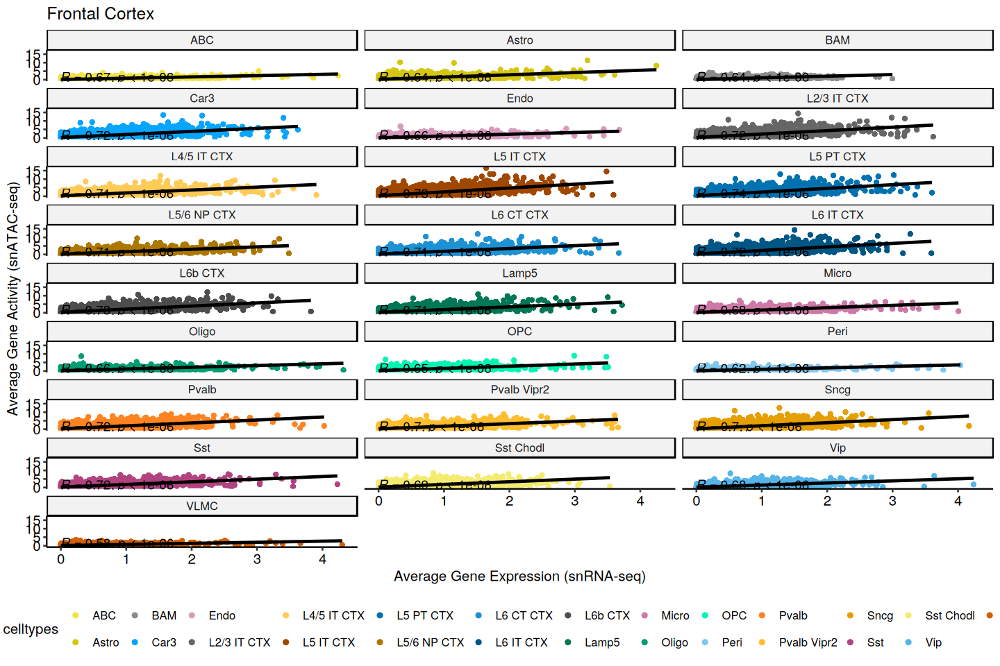

In [375]:
corrMultiome(fctx, 'frontal cortex', 13L) + ggtitle("Frontal Cortex")

### DARs

#### DAR Barplots

In [1]:
dar_fctx <- readRDS("C9Mouse_Frontal_Cortex/DAR/DA_lr.rds")
dar_hippo <- readRDS("hippocampus_multiome_2024/DAR/DARs.RDS")
dar_hippo <- dar_hippo[[1]] # dar_hippo[[1]] contains raw dars, dar_hippo[[2]] contains filtered dars

In [3]:
print(rownames(dar_fctx$markers_C9KO$`L2/3 IT CTX`[abs(dar_fctx$markers_C9KO$`L2/3 IT CTX`$avg_log2FC) > 0.05 & dar_fctx$markers_C9KO$`L2/3 IT CTX`$p_val_adj < 0.05, ]))

  [1] "chr15-76783328-76784143"   "chr13-9011582-9012224"    
  [3] "chr5-47299036-47300195"    "chr11-49818228-49820482"  
  [5] "chr7-141326760-141328787"  "chr4-116175470-116177533" 
  [7] "chr3-21563973-21565357"    "chr4-35213322-35213861"   
  [9] "chr5-30992931-30994595"    "chr18-46393616-46394962"  
 [11] "chr13-59401243-59403106"   "chr2-108812229-108813550" 
 [13] "chr17-3346755-3348030"     "chr3-70543428-70544616"   
 [15] "chr19-57542395-57544203"   "chr4-151592435-151593473" 
 [17] "chr11-111100142-111101100" "chr13-37157836-37159760"  
 [19] "chr1-175296267-175297360"  "chr1-154187854-154189107" 
 [21] "chr13-99078526-99079944"   "chr3-20892600-20894089"   
 [23] "chr13-95849325-95850155"   "chr10-109527706-109528889"
 [25] "chr4-12376328-12377689"    "chr11-88404273-88405821"  
 [27] "chr14-60692894-60694017"   "chr2-143133842-143134463" 
 [29] "chr5-31983872-31985328"    "chr12-95486036-95486966"  
 [31] "chr19-10367685-10368836"   "chr13-107573646-107574611"
 [33] "c

In [2]:
mergeDARs <- function(dars_list, genotype) {
    clustnames <- names(dars_list$markers_C9KO)
    # Add cluster column to each dataframe
    dars_list <- lapply(seq_along(dars_list), function(i) {
        if (!is.null(dars_list[[i]])) {  # Check if the entry is not NULL
            dars_list[[i]]$cluster <- names(dars_list)[[i]]
            dars_list[[i]] <- rownames_to_column(dars_list[[i]], var = "region")
            return(dars_list[[i]])
        }
    })
    # Remove any NULL entries that might be left after the lapply
    dars_list <- dars_list[!sapply(dars_list, is.null)]
    # Merge data frames while retaining the cluster column
    merged_df <- do.call(rbind, dars_list)
    merged_df$genotype <- gsub("markers_", "", genotype)
    return(merged_df)
}

mergeAllDARs <- function(dars) {
    merged_dars <- lapply(names(dars), function(genotype) {
        if (!is.null(dars[[genotype]])) {
            mergeDARs(dars[[genotype]], genotype)
        }
    })
    # Remove any NULL entries before binding rows
    merged_dars <- merged_dars[!sapply(merged_dars, is.null)]
    merged_all_dars <- bind_rows(merged_dars)
    return(merged_all_dars)
}
fctx_df <- mergeAllDARs(dar_fctx) %>%
	filter(abs(avg_log2FC) > 0.3, p_val_adj < 0.05)
hippo_df <- mergeAllDARs(dar_hippo) %>% 
	filter(abs(avg_log2FC) > 0.3, p_val_adj < 0.05)
hippo_df$cluster <- gsub('Astro-1','Astro',hippo_df$cluster)

ERROR: Error in mergeAllDARs(dar_fctx) %>% filter(abs(avg_log2FC) > 0.3, p_val_adj < : could not find function "%>%"


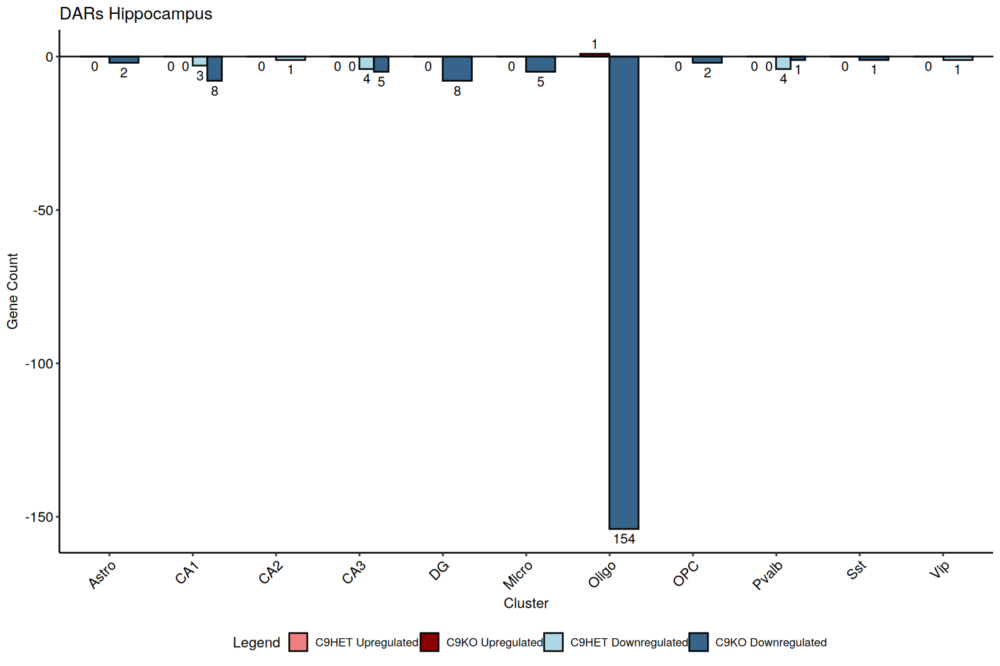

In [379]:
deg_barplot(deg = hippo_df, c('Astro','CA1','CA2','CA3', 'CA4','Cck','CR','DG','L2/3 IT','L6b ENT', 'Lamp5','Lamp5 Lhx6', 'Micro','Oligo','OPC','Pvalb','Sst','SUB','Vip')) + ggtitle('DARs Hippocampus')

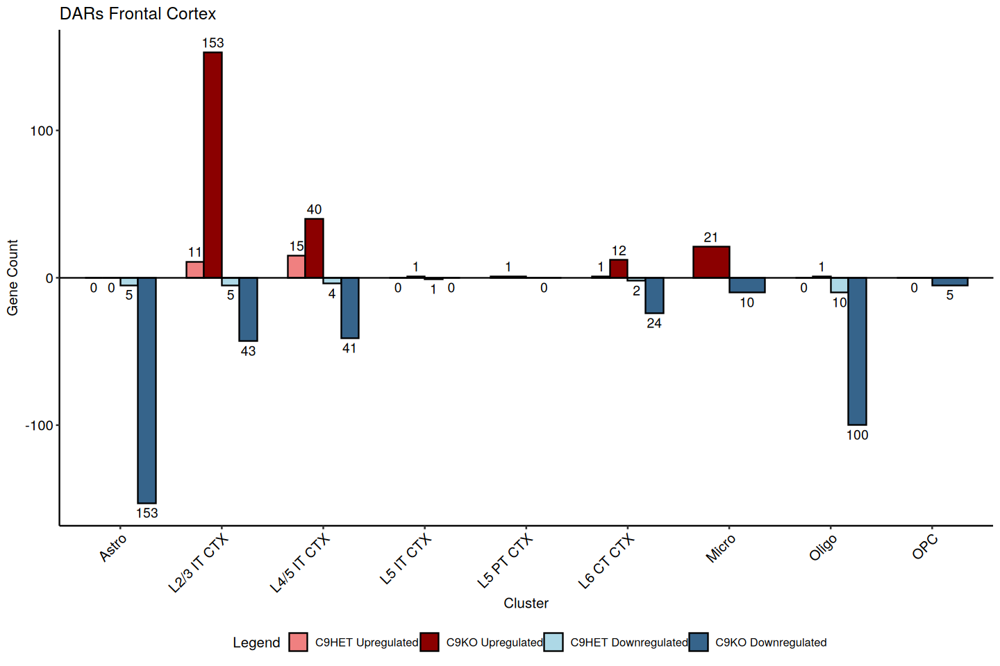

In [380]:
deg_barplot(deg = fctx_df, c('Astro','L2/3 IT CTX','L4/5 IT CTX','L5 IT CTX', 'L5 PT CTX','L5/6 NP CTX','L6 CT CTX','C6 IT CTX','L6b CTX','Lamp5','Micro','Oligo','OPC','Pvalb','Sst','Vip')) + ggtitle('DARs Frontal Cortex')

>> preparing features information...		 2024-08-17 01:06:52 AM 
>> identifying nearest features...		 2024-08-17 01:06:52 AM 
>> calculating distance from peak to TSS...	 2024-08-17 01:06:52 AM 
>> assigning genomic annotation...		 2024-08-17 01:06:52 AM 
>> adding gene annotation...			 2024-08-17 01:07:03 AM 


Loading required package: org.Mm.eg.db



'select()' returned 1:1 mapping between keys and columns



>> assigning chromosome lengths			 2024-08-17 01:07:04 AM 
>> done...					 2024-08-17 01:07:04 AM 


Warning message in rownames(x = object) == rownames(x = new.data):
"longer object length is not a multiple of shorter object length"
Warning message in SetAssayData.ChromatinAssay(object = new.assay, slot = "motifs", :
"Features do not match in ChromatinAssay and Motif object.
                Subsetting the Motif object."


>> preparing features information...		 2024-08-17 01:07:10 AM 
>> identifying nearest features...		 2024-08-17 01:07:10 AM 
>> calculating distance from peak to TSS...	 2024-08-17 01:07:10 AM 
>> assigning genomic annotation...		 2024-08-17 01:07:10 AM 
>> adding gene annotation...			 2024-08-17 01:07:12 AM 


'select()' returned 1:1 mapping between keys and columns



>> assigning chromosome lengths			 2024-08-17 01:07:12 AM 
>> done...					 2024-08-17 01:07:12 AM 


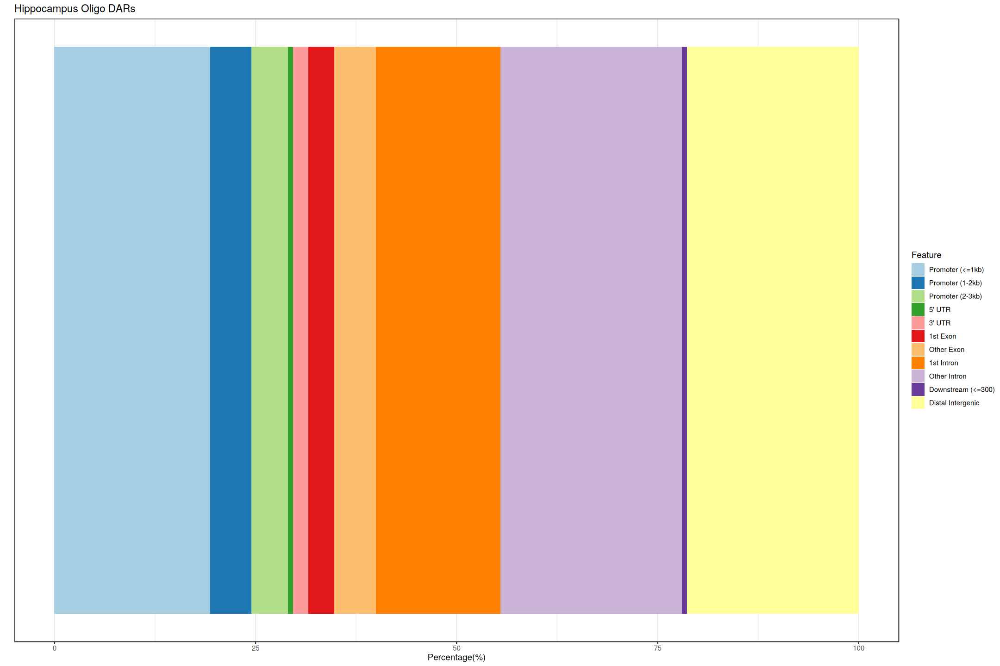

In [15]:
library(ChIPseeker)
library(EnsDb.Mmusculus.v79)
library(TxDb.Mmusculus.UCSC.mm10.knownGene)

DefaultAssay(hippo) <- 'peaks'
DefaultAssay(fctx) <- 'peaks'
Idents(hippo) <- 'class'
Idents(fctx) <- 'subclass'

darAnnotation <- function(seu_obj, dars, cluster) {
    txdb = TxDb.Mmusculus.UCSC.mm10.knownGene
    seu_obj <- subset(seu_obj, idents = cluster)
    DefaultAssay(seu_obj) <- 'peaks'

    # Subset seu_obj peaks where DARs are
    seu_obj_range <- seu_obj[dars$region[dars$cluster == cluster], ]
    seu_objPeakAnno <- annotatePeak(granges(seu_obj_range), tssRegion=c(-3000, 3000),
                                TxDb=txdb, annoDb="org.Mm.eg.db")
    p <- plotAnnoBar(seu_objPeakAnno)
    return(p)
}
p1 <- darAnnotation(hippo, hippo_df, cluster = 'Oligo') + ggtitle('Hippocampus Oligo DARs')
p2 <- darAnnotation(fctx, fctx_df, cluster = 'Oligo') + ggtitle('Frontal Cortex Oligo DARs')
p1

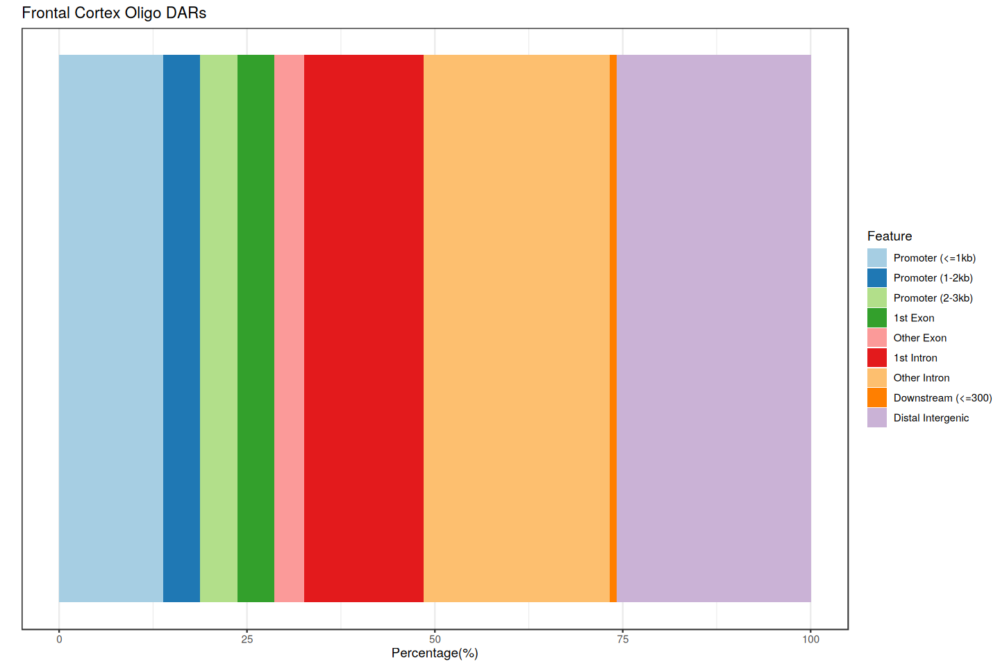

In [6]:
p2

Warning message in rownames(x = object) == rownames(x = new.data):
"longer object length is not a multiple of shorter object length"
Warning message in SetAssayData.ChromatinAssay(object = new.assay, slot = "motifs", :
"Features do not match in ChromatinAssay and Motif object.
                Subsetting the Motif object."


>> preparing features information...		 2024-06-14 10:42:55 AM 
>> identifying nearest features...		 2024-06-14 10:42:55 AM 
>> calculating distance from peak to TSS...	 2024-06-14 10:42:55 AM 
>> assigning genomic annotation...		 2024-06-14 10:42:55 AM 
>> adding gene annotation...			 2024-06-14 10:42:57 AM 


'select()' returned 1:many mapping between keys and columns



>> assigning chromosome lengths			 2024-06-14 10:42:57 AM 
>> done...					 2024-06-14 10:42:57 AM 


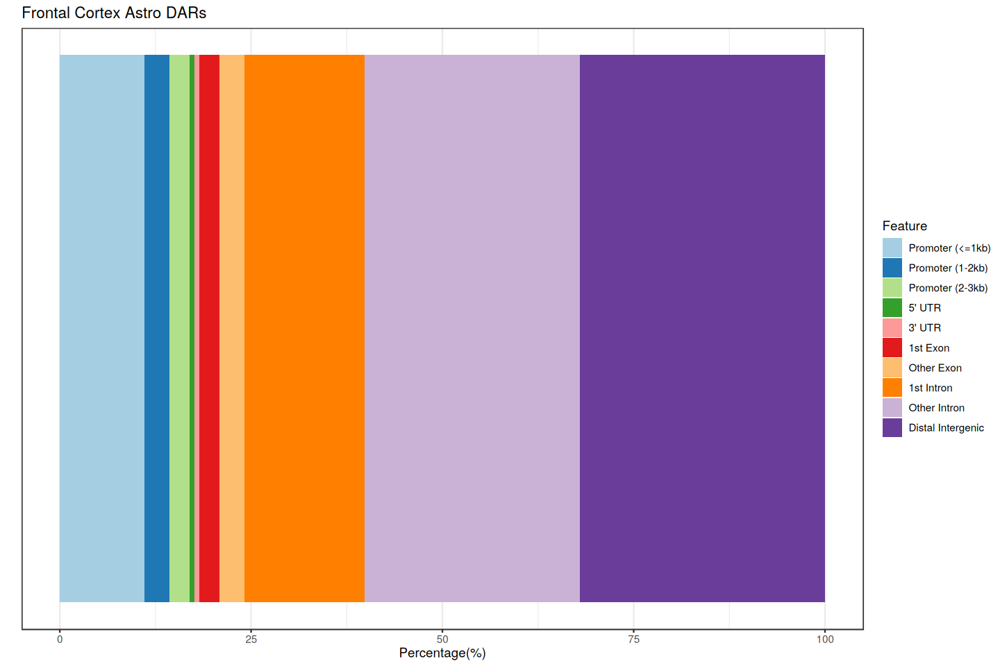

In [17]:
darAnnotation(fctx, fctx_df, cluster = 'Astro') + ggtitle('Frontal Cortex Astro DARs')

In [21]:
fctx_df <- fctx_df %>%
	mutate(regulation = ifelse(avg_log2FC > 0, "upregulated", "downregulated"))
p1 <- darAnnotation(fctx, subset(fctx_df, regulation == 'upregulated'), cluster = 'L2/3 IT CTX') + ggtitle('Frontal Cortex L2/3 IT CTX DARs Upregulated')
p2 <- darAnnotation(fctx, subset(fctx_df, regulation == 'downregulated'), cluster = 'L2/3 IT CTX') + ggtitle('Frontal Cortex L2/3 IT CTX DARs Downregulated')
p1

In [20]:
pdf('figures/oligo_DARs.pdf', width = 12, height = 2)
darAnnotation(fctx, fctx_df[fctx_df$avg_log2FC < 0, ], cluster = 'Oligo')+ ggtitle('Frontal Cortex Oligo DARs Downregulated') +
darAnnotation(hippo, hippo_df[hippo_df$avg_log2FC < 0, ], cluster = 'Oligo')+ ggtitle('Hippocampus Oligo DARs Downregulated')
dev.off()



Warning message in rownames(x = object) == rownames(x = new.data):
"longer object length is not a multiple of shorter object length"
Warning message in SetAssayData.ChromatinAssay(object = new.assay, slot = "motifs", :
"Features do not match in ChromatinAssay and Motif object.
                Subsetting the Motif object."


>> preparing features information...		 2024-08-17 01:12:37 AM 
>> identifying nearest features...		 2024-08-17 01:12:37 AM 
>> calculating distance from peak to TSS...	 2024-08-17 01:12:37 AM 
>> assigning genomic annotation...		 2024-08-17 01:12:37 AM 
>> adding gene annotation...			 2024-08-17 01:12:39 AM 


'select()' returned 1:1 mapping between keys and columns



>> assigning chromosome lengths			 2024-08-17 01:12:39 AM 
>> done...					 2024-08-17 01:12:39 AM 
>> preparing features information...		 2024-08-17 01:12:49 AM 
>> identifying nearest features...		 2024-08-17 01:12:49 AM 
>> calculating distance from peak to TSS...	 2024-08-17 01:12:49 AM 
>> assigning genomic annotation...		 2024-08-17 01:12:49 AM 
>> adding gene annotation...			 2024-08-17 01:12:51 AM 


'select()' returned 1:1 mapping between keys and columns



>> assigning chromosome lengths			 2024-08-17 01:12:51 AM 
>> done...					 2024-08-17 01:12:51 AM 


png 
  2

In [1]:
ccans_fctx <- readRDS('C9Mouse_Frontal_Cortex/CCAN/fctx_ccans.rds')
ccans_hippo <- readRDS('hippocampus_multiome_2024/CCAN/hippo_ccans.rds')

In [13]:
library(Seurat)
library(Signac)
library(ggplot2)

pdf('figures/apoe_micro.pdf', width = 8, height = 12)
CoveragePlot(ccans_fctx$Micro, region = 'chr7-19696109-19699188', group.by = 'genotype', extend.upstream = 3000, extend.downstream = 2000, features = "Apoe") & scale_fill_manual(values = c("#595959","grey", "#ff0000"))
dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

In [3]:
pdf('figures/oligo_bcl2l1.pdf', width = 12, height = 10)
CoveragePlot(ccans_fctx$Oligo, 'chr2-152785158-152786303', group.by = 'genotype', extend.upstream = 10000, extend.downstream = 60000, features = "Bcl2l1") + 
CoveragePlot(ccans_hippo$Oligo, 'chr2-152785158-152786303', group.by = 'genotype', extend.upstream = 10000, extend.downstream = 60000, features = "Bcl2l1") & 
scale_fill_manual(values = c("#595959","grey", "#ff0000"))
dev.off()

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


png 
  2

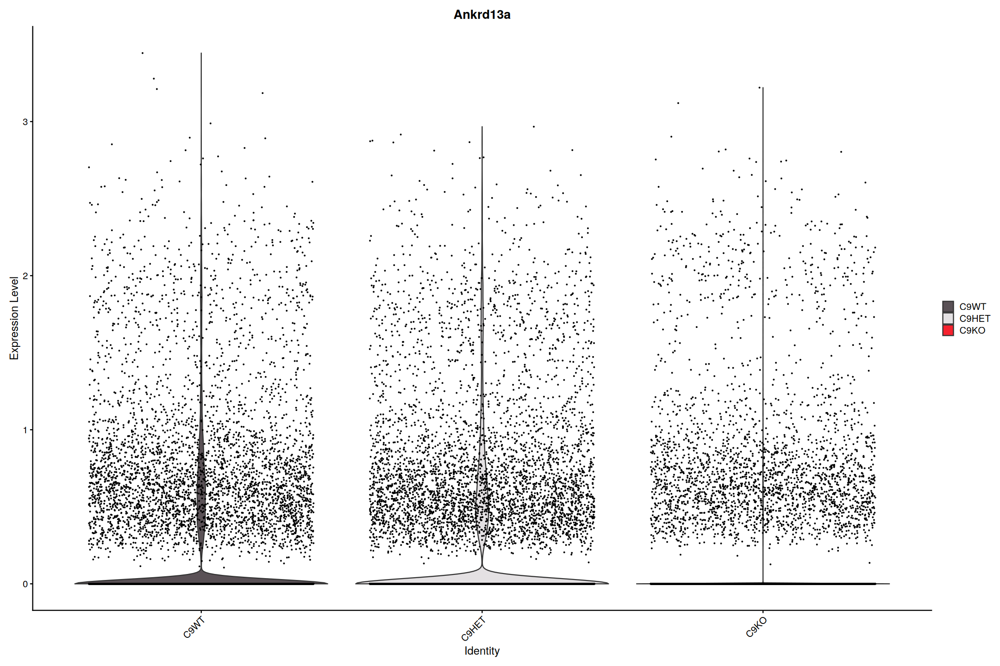

In [17]:
VlnPlot_scCustom(hippo, 'Ankrd13a', group.by = 'genotype')

In [396]:
# Create subsetted Seurat object with cicero links
ciceroSubset <- function(seu_obj, cluster) {
	find_links <- function(seu_obj){
		seu.cds <- as.cell_data_set(x = seu_obj)
		umap_coords <- seu_obj@reductions$umap.peaks
		seu.cicero <- make_cicero_cds(seu.cds, reduced_coordinates = reducedDims(seu.cds)$UMAP)
		genome <- seqlengths(BSgenome.Mmusculus.UCSC.mm10)
		genome.df <- data.frame("chr" = names(genome), "length" = genome)
		conns <- run_cicero(seu.cicero, genomic_coords = genome.df, sample_num = 100)
		CCAN_assigns <- generate_ccans(conns)
		links <- ConnectionsToLinks(conns = conns, ccans = CCAN_assigns, threshold = 0.25)
		Links(seu_obj) <- links
		return(seu_obj)                          
	}
DefaultAssay(seu_obj) <- 'peaks'
seu <- subset(seu_obj, idents = cluster) %>%
	find_links()
}
oligo_hippo <- ciceroSubset(hippo, cluster = "Oligo")
oligo_fctx <- ciceroSubset(fctx, cluster = "Oligo")

Overlap QC metrics:
Cells per bin: 50
Maximum shared cells bin-bin: 44
Mean shared cells bin-bin: 0.258995214882343
Median shared cells bin-bin: 0



[1] "Starting Cicero"
[1] "Calculating distance_parameter value"
[1] "Running models"
[1] "Assembling connections"
[1] "Successful cicero models:  10022"
[1] "Other models: "

  Too many elements in range Zero or one element in range 
                           1                         1375 
[1] "Models with errors:  0"
[1] "Done"
[1] "Coaccessibility cutoff used: 0.11"


Overlap QC metrics:
Cells per bin: 50
Maximum shared cells bin-bin: 44
Mean shared cells bin-bin: 0.437812946756581
Median shared cells bin-bin: 0



[1] "Starting Cicero"
[1] "Calculating distance_parameter value"
[1] "Running models"
[1] "Assembling connections"
[1] "Successful cicero models:  10049"
[1] "Other models: "

  Too many elements in range Zero or one element in range 
                           1                         1348 
[1] "Models with errors:  0"
[1] "Done"
[1] "Coaccessibility cutoff used: 0.14"


Warning message in rownames(x = object) == rownames(x = new.data):
"longer object length is not a multiple of shorter object length"
Warning message in SetAssayData.ChromatinAssay(object = new.assay, slot = "motifs", :
"Features do not match in ChromatinAssay and Motif object.
                Subsetting the Motif object."
Warning message:
"Removed 9 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message:
"Removed 9 rows containing missing values or values outside the scale range
(`geom_segment()`)."


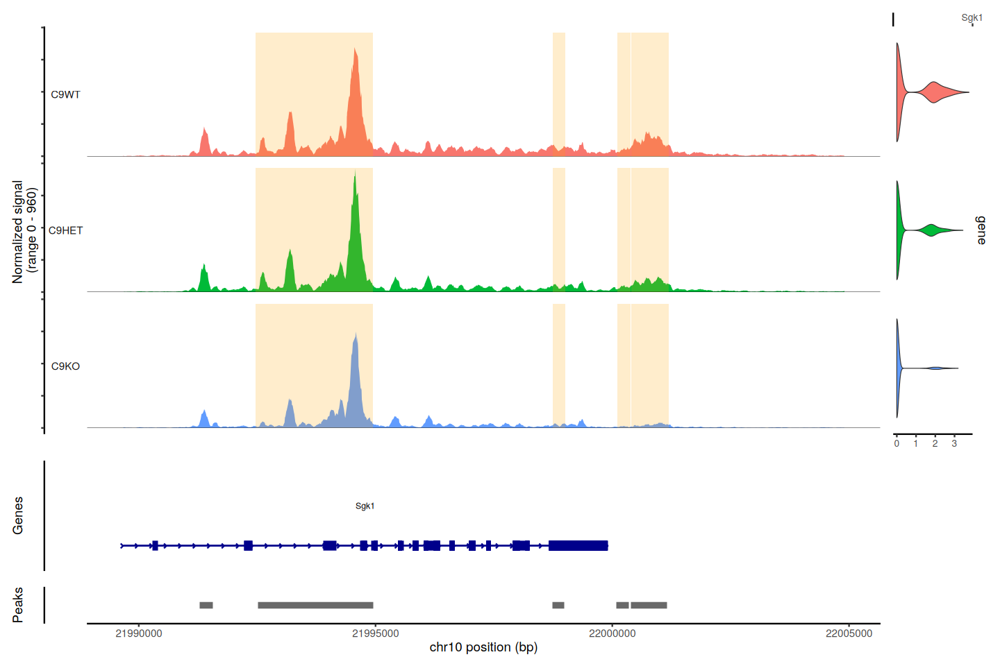

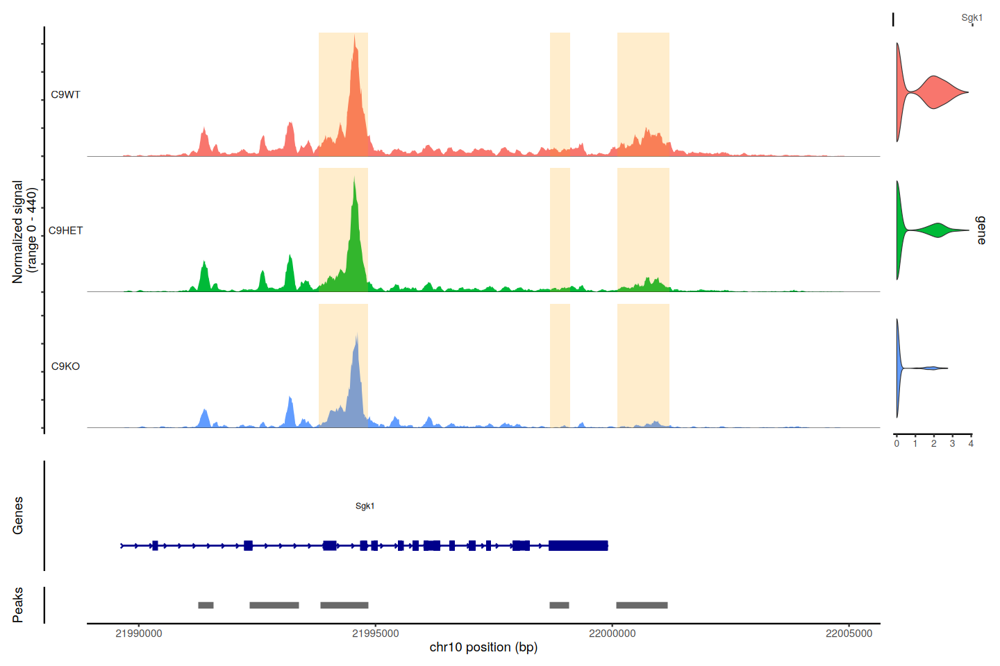

In [47]:
DefaultAssay(hippo) <- 'peaks'
DefaultAssay(fctx) <- 'peaks'
oligo_hippo <- subset(hippo, idents = 'Oligo')
oligo_fctx <- subset(fctx, idents = 'Oligo')
gr_hippo <- granges(oligo_hippo[hippo_df[hippo_df$cluster == 'Oligo',][["region"]]])
gr_hippo <- subset(gr_hippo, seqnames(gr_hippo) == "chr10" & start(gr_hippo) >= 21990000 & end(gr_hippo) <= 22900000)
gr_hippo$color = 'orange'
gr_fctx <- granges(oligo_fctx[fctx_df[fctx_df$cluster == 'Oligo',][["region"]]])
gr_fctx <- subset(gr_fctx, seqnames(gr_fctx) == "chr10" & start(gr_fctx) >= 21990000 & end(gr_fctx) <= 22900000)
gr_fctx$color = 'orange'
CoveragePlot(oligo_hippo, region = "chr10-21994666-21999903", features = "Sgk1", group.by = 'genotype', extend.upstream = 5000, extend.downstream = 5000,region.highlight = gr_hippo, ranges.group.by = 'color') 
CoveragePlot(oligo_fctx, region = "chr10-21994666-21999903", features = "Sgk1", group.by = 'genotype', extend.upstream = 5000, extend.downstream = 5000, region.highlight = gr_fctx, ranges.group.by = 'color') 

In [ ]:
process_module_scores <- function(seu_obj, deg_filt, DA_motifs) {
  
  motifs_in_promoters <- function(obj, motif, deg_list) {
    DefaultAssay(obj) <- 'peaks'
    accessible <- Motifs(obj)@data[, motif]
    accessible <- names(accessible)[accessible > 0]
    if (!is.null(accessible)) {  
      accessible_granges <- StringToGRanges(accessible)
      promoters <- promoters(accessible_granges, upstream = 2000, downstream = 200)
      genes_obj <- Annotation(obj)
      obj_promoters <- promoters(genes_obj, upstream = 2000, downstream = 200)
      target_genes <- obj_promoters[obj_promoters@ranges %in% promoters@ranges]
      DE_obj <- intersect(rownames(deg_list), target_genes$gene_name)
      if (length(DE_obj) == 0) {return(NULL)}
      return(DE_obj)
    }
  }
  
  module_score <- function(obj, features) {
    if (length(features) > 1) {
      mg_scores <- ScoreSignatures_UCell(GetAssayData(obj, slot = 'data'), features = features, name = NULL)
      melted <- reshape2::melt(mg_scores)
      colnames(melted) <- c("Cell", "Signature", "UCell_score")
      melted$genotype <- obj$genotype
      return(melted)
    } else {
      return(NULL)
    }
  }
  
  motifs <- function(obj, motifs_list, deg_list) {
    motif_results <- list()
    for (c in names(motifs_list)) {
      sub <- subset(obj, idents = c)
      m_list <- motifs_list[[c]]$motif
      motif_results[[c]] <- list()
      for (motif in m_list) {
        motif_results[[c]][[motif]] <- motifs_in_promoters(sub, motif, deg_list[[c]])
      }
    }
    return(motif_results)
  }
  
  process_module_scores_internal <- function(obj, mp_list) {
    module_scores_list <- list()
    if (is.null(obj[['GAM']])) {
      gam <- GeneActivity(obj, assay = 'peaks')
      obj[['GAM']] <- CreateAssayObject(gam)
    }
    for (i in seq_along(mp_list)) {
      clust <- names(mp_list)[i]
      mg_signatures <- mp_list[[i]]
      DefaultAssay(obj) <- 'RNA'
      mscore_RNA <- module_score(subset(obj, idents = clust), features = mg_signatures)
      DefaultAssay(obj) <- 'GAM'
      mscore_GAM <- module_score(subset(obj, idents = clust), features = mg_signatures)
      module_scores_list[[clust]] <- list(RNA = mscore_RNA, GAM = mscore_GAM)
    }
    return(module_scores_list)
  }
  
  # Process motifs for HET
  motifs_C9HET <- motifs(seu_obj, DA_motifs$C9HET, deg_filt$markers_C9HET)
  
  # Process motifs for KO
  motifs_C9KO <- motifs(seu_obj, DA_motifs$C9KO, deg_filt$markers_C9KO)
  
  # Remove any clusters that have no DEG overlaps
  motifs_C9HET <- Filter(function(x) length(x) > 0, motifs_C9HET)
  motifs_C9KO <- Filter(function(x) length(x) > 0, motifs_C9KO)
  
  # Process module scores for HET
  mscore_C9HET <- process_module_scores_internal(seu_obj, motifs_C9HET)
  
  # Process module scores for KO
  mscore_C9KO <- process_module_scores_internal(seu_obj, motifs_C9KO)
  
  return(list(HET = mscore_C9HET, KO = mscore_C9KO))
}


In [14]:
oligo <- subset(fctx, idents = 'Oligo')

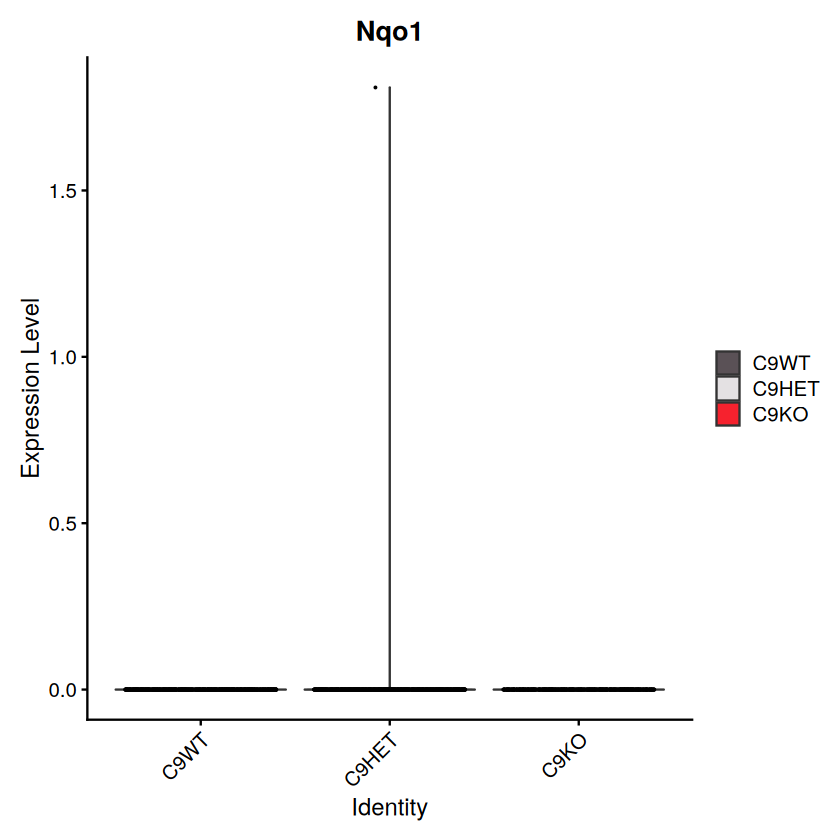

In [40]:
VlnPlot_scCustom(ccans_fctx$Micro, 'Nqo1', group.by = 'genotype')

In [5]:
fctx_ccan <- readRDS("C9Mouse_Frontal_Cortex/CCAN/fctx_ccans.rds")

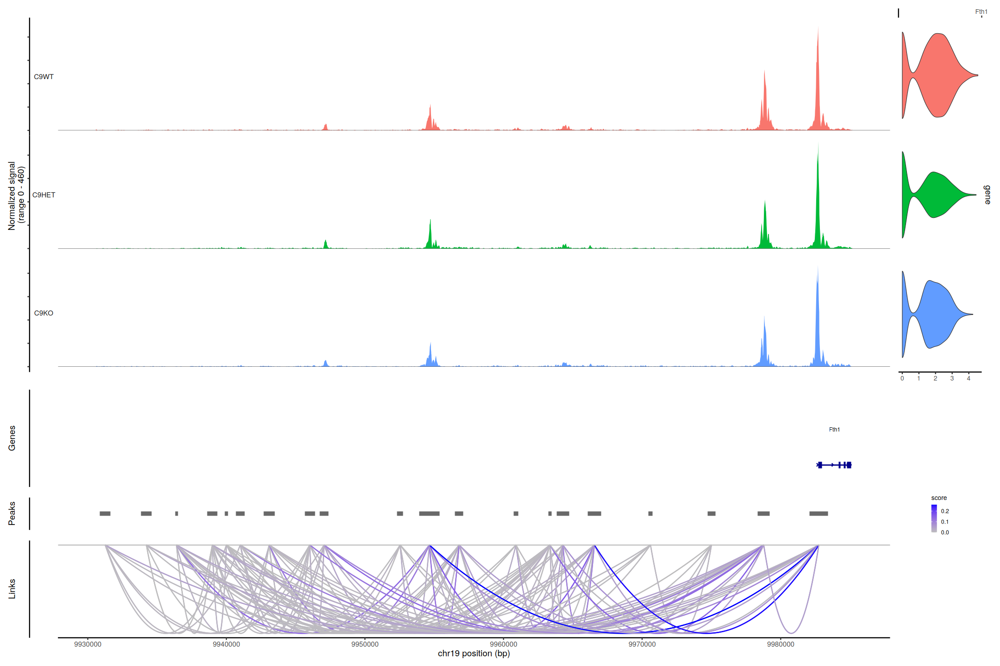

In [13]:
CoveragePlot(fctx_ccan$Astro, region = "chr19-9980576-9985162", group.by = 'genotype', extend.upstream = 50000, extend.downstream = 0, features = 'Fth1')

In [43]:
astro_links <- Links(fctx_ccan$Astro)[Links(fctx_ccan$Astro)$score >= 0.2]
astro_links

GRanges object with 35394 ranges and 2 metadata columns:
          seqnames              ranges strand |     score     group
             <Rle>           <IRanges>  <Rle> | <numeric> <numeric>
      [1]     chr1   10009117-10014190      * |  0.256667         2
      [2]     chr1 100089047-100089591      * |  0.613695      4855
      [3]     chr1 100089047-100089591      * |  0.613695      4855
      [4]     chr1   10009117-10014190      * |  0.256667         2
      [5]     chr1   10021310-10037879      * |  0.210817         2
      ...      ...                 ...    ... .       ...       ...
  [35390]     chrX   99535255-99547975      * |  0.341696     21670
  [35391]     chrX   99542973-99547975      * |  0.251942     21670
  [35392]     chrX   99542973-99560725      * |  0.206104     21670
  [35393]     chrX   99574826-99975607      * |  0.205343     21670
  [35394]     chrX   99574826-99975607      * |  0.205343     21670
  -------
  seqinfo: 21 sequences from an unspecified genom

In [49]:
library("TxDb.Mmusculus.UCSC.mm10.knownGene")
txdb <- TxDb.Mmusculus.UCSC.mm10.knownGene
tss <- promoters(genes(txdb), upstream = 0, downstream = 1)
proximal_regions <- resize(tss, width = 2000, fix = "center")
overlaps <- findOverlaps(astro_links, proximal_regions)
astro_links$annotation <- "distal"
astro_links$annotation[queryHits(overlaps)] <- "proximal"

  66 genes were dropped because they have exons located on both strands
  of the same reference sequence or on more than one reference sequence,
  so cannot be represented by a single genomic range.
  Use 'single.strand.genes.only=FALSE' to get all the genes in a
  GRangesList object, or use suppressMessages() to suppress this message.



In [59]:
fctx_dar <- readRDS('C9Mouse_Frontal_Cortex/DAR/DA_lr_filt_annotated.rds')

In [65]:
pdf('figures/micro_deg.pdf', width = 4, height = 4)
ggvenn(list("Hippocampus" = deg_hippo_filt[deg_hippo_filt$cluster == 'Micro',]$gene, 
						`Frontal Cortex` = deg_fctx_filt[deg_fctx_filt$cluster == 'Micro',]$gene))
dev.off()

png 
  2

In [66]:
intersect(deg_hippo_filt[deg_hippo_filt$cluster == 'Micro',]$gene, deg_fctx_filt[deg_fctx_filt$cluster == 'Micro',]$gene)

[1] "Ccnd3"   "Fth1"    "Tmsb4x"  "Selplg"  "Cst3"    "C1qa"    "Il6st"  
 [8] "Fkbp5"   "Gm21860" "C1qb"

In [1]:
table(fctx$sex, fctx$sample)

ERROR: Error in table(fctx$sex, fctx$sample): object 'fctx' not found


In [87]:
pdf('figures/compliment_micro.pdf', width = 8, height = 4)
VlnPlot_scCustom(hippo, c('C1qa', 'C1qb'),idents ='Micro',group.by = 'genotype', pt.size = 0) & ylim(limits = c(0,5)) & geom_boxplot(width = 0.06, color = 'black', fill = 'white', outlier.alpha = 0.2) & theme_pubr() 
VlnPlot_scCustom(fctx, c('C1qa', 'C1qb'),idents ='Micro',group.by = 'genotype', pt.size = 0) & ylim(limits= c(0,5))&  geom_boxplot(width = 0.06, color = 'black', fill = 'white', outlier.alpha = 0.2) & theme_pubr()
dev.off()

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Warning message:
"Removed 639 rows containing non-finite outside the scale range
(`stat_ydensity()`)."
Warning message:
"Removed 639 rows containing non-finite outside the scale range
(`stat_boxplot()`)."
Warning message:
"Removed 648 rows containing non-finite outside the scale range
(`stat_ydensity()`)."
Warning message:
"Removed 648 rows containing non-finite outside the scale range
(`stat_boxplot()`)."
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Warning message:
"Removed 192 rows containing non-finite outside the scale range
(`stat_ydensity()`)."
Warning message:
"Removed 192 rows containing non-finite outside the scale range
(`stat_box

png 
  2

In [14]:
astro_dar <- dar_fctx$markers_C9KO$Astro
astro_dar <- astro_dar[abs(astro_dar$avg_log2FC) > 0.3 & astro_dar$p_val_adj < 0.05,]

In [123]:
tmp <- subsetByOverlaps(StringToGRanges(rownames(astro_dar)), astro_links) # I want to first catalogue peaks as distal, or proximal then 
overlaps <- findOverlaps(tmp, proximal_regions)
tmp$annotation <- "distal"
tmp$annotation[queryHits(overlaps)] <- "proximal"
print(tmp[tmp$annotation == 'proximal'])

GRanges object with 9 ranges and 1 metadata column:
      seqnames              ranges strand |  annotation
         <Rle>           <IRanges>  <Rle> | <character>
  [1]     chr2   30265543-30266846      * |    proximal
  [2]    chr17   56108340-56110079      * |    proximal
  [3]     chr7   17060648-17061434      * |    proximal
  [4]    chr17     8524113-8525713      * |    proximal
  [5]     chr8   10928169-10929025      * |    proximal
  [6]     chr7 126675675-126676686      * |    proximal
  [7]     chr7   17062161-17062826      * |    proximal
  [8]     chr8   57455579-57457599      * |    proximal
  [9]     chr8   85491935-85493980      * |    proximal
  -------
  seqinfo: 19 sequences from an unspecified genome; no seqlengths


Warning message:
“Removed 175 rows containing missing values or values outside the scale range
(`geom_segment()`).”


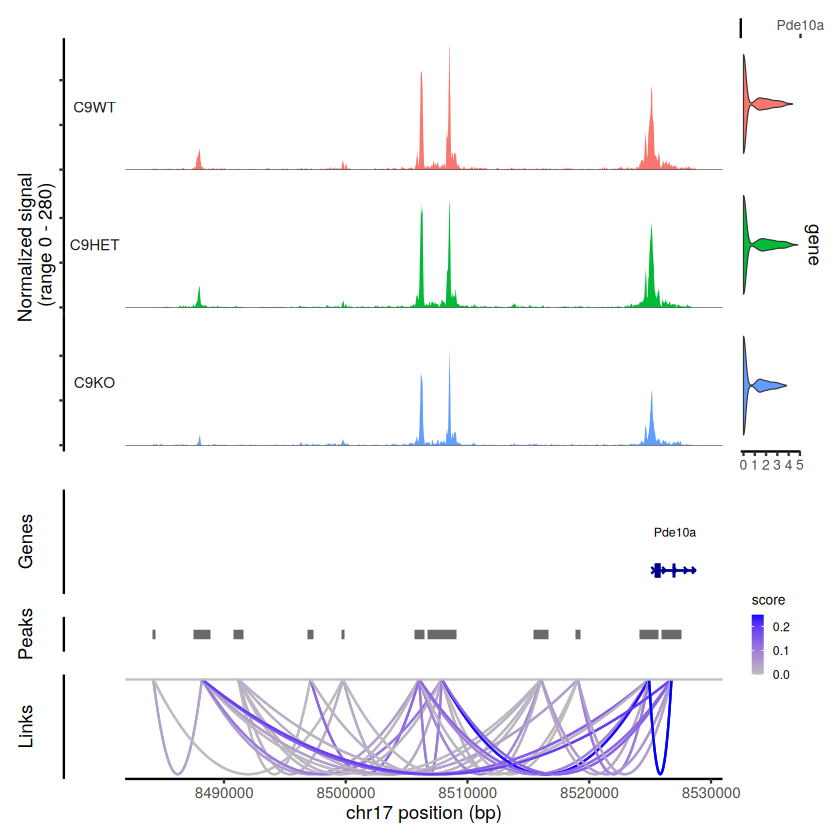

In [137]:
CoveragePlot(fctx_ccan$Astro, group.by = 'genotype', region = 'chr17-8524113-8525713', extend.upstream = 40000, extend.downstream = 3000, features = 'Pde10a')

In [106]:
dar_granges <- StringToGRanges(regions = rownames(astro_dar))
tss_proximal <- resize(dar_granges, width = 1000, fix = "center")
dar_proximal <- subsetByOverlaps(dar_granges, tss_proximal)
dar_distal <- setdiff(dar_granges, dar_proximal)
links_within_tss <- subsetByOverlaps(astro_links, tss_proximal)
links_upstream_distal <- subsetByOverlaps(astro_links, dar_distal)
links_filtered <- intersect(links_within_tss, links_upstream_distal)
accessible_peaks <- subsetByOverlaps(links_filtered, dar_granges)

In [54]:
head(deg_fctx_filt)

,gene,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,genotype,region
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,Nr4a1,3.776849e-16,-2.703116,0.039,0.515,1.214635e-11,ABC,C9HET,frontal cortex
2,Btg2,1.197073e-15,-3.191631,0.097,0.553,3.849785e-11,ABC,C9HET,frontal cortex
3,Nr4a2,2.533502e-14,-3.012692,0.146,0.524,8.147744e-10,ABC,C9HET,frontal cortex
4,Egr1,2.913641e-14,-2.412437,0.029,0.447,9.370270e-10,ABC,C9HET,frontal cortex
5,Clic4,2.201435e-12,-2.054522,0.621,0.883,7.079816e-08,ABC,C9HET,frontal cortex
6,Nr4a3,4.751913e-12,-3.297933,0.068,0.437,1.528215e-07,ABC,C9HET,frontal cortex


In [15]:
annotated_fctx <- readRDS('C9Mouse_Frontal_Cortex/DAR/DA_lr_filt_annotated.rds')
annotated_hip <- readRDS("hippocampus_multiome_2024/DAR/annotated_DARs.rds")
fctxdar_df <- mergeAllDARs(annotated_fctx)
library(ggvenn)
pdf('figures/venn_oligo.pdf', width = 8, height = 8)
ggvenn(list('DEG Frontal Cortex' = deg_fctx_filt[deg_fctx_filt$cluster == 'Oligo',]$gene, 
						'DAR Frontal Cortex' = fctxdar_df[fctxdar_df$cluster == 'Oligo',]$gene_name,
						'DAR Hippocampus' = annotated_hip[annotated_hip$cluster == 'Oligo',]$gene_name,
						'DEG Hippocampus' = deg_hippo_filt[deg_hippo_filt$cluster == 'Oligo',]$gene))
dev.off()

png 
  2

In [20]:
base::Reduce(intersect, list(deg_fctx_filt[deg_fctx_filt$cluster == 'Oligo',]$gene, fctxdar_df[fctxdar_df$cluster == 'Oligo',]$gene_name, annotated_hip[annotated_hip$cluster == 'Oligo',]$gene_name, deg_hippo_filt[deg_hippo_filt$cluster == 'Oligo',]$gene))

[1] "Sgk1"     "Zbtb16"   "Arid5b"   "Mobp"     "Bcl2l1"   "Ptgds"    "Ankrd13a"

In [4]:
motifs_fctx <- readRDS('C9Mouse_Frontal_Cortex/motif/motifs_chromvar_filt.rds')
motifs_hip <- readRDS('hippocampus_multiome_2024/motifs/DA_motifs_chromvar.rds')

In [2]:
motifs_fctx$C9KO$`L2/3 IT CTX`

,p_val,avg_diff,pct.1,pct.2,p_val_adj,motif,motif.name
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSMUSG00000030557-LINE1510-Mef2a-I,9.593564e-136,0.9315947,0.684,0.422,8.480711e-133,ENSMUSG00000030557_LINE1510_Mef2a_I,Mef2a
ENSMUSG00000001419-LINE6419-Mef2d-I-N14,3.388661e-129,0.8832901,0.670,0.403,2.995576e-126,ENSMUSG00000001419_LINE6419_Mef2d_I_N14,Mef2d
ENSMUSG00000079033-LINE16135-Mef2b-I-N14,3.388661e-129,0.8832901,0.670,0.403,2.995576e-126,ENSMUSG00000079033_LINE16135_Mef2b_I_N14,Mef2b
ENSMUSG00000005583-LINE1508-Mef2c-I,6.016427e-117,0.8265447,0.693,0.446,5.318521e-114,ENSMUSG00000005583_LINE1508_Mef2c_I,Mef2c
ENSMUSG00000070495-LINE1841-Ctcfl-I,1.917249e-106,0.8637878,0.251,0.118,1.694848e-103,ENSMUSG00000070495_LINE1841_Ctcfl_I,Ctcfl
ENSMUSG00000005698-LINE295-Ctcf-D,5.605422e-103,0.9111616,0.265,0.134,4.955193e-100,ENSMUSG00000005698_LINE295_Ctcf_D,Ctcf
ENSMUSG00000005373-LINE126-Mlxipl-I-N1,2.922962e-52,0.4520276,0.286,0.162,2.583898e-49,ENSMUSG00000005373_LINE126_Mlxipl_I_N1,Mlxipl
ENSMUSG00000023990-LINE80-Tcfeb-D,1.199423e-47,0.4427514,0.250,0.147,1.060290e-44,ENSMUSG00000023990_LINE80_Tcfeb_D,Tcfeb
ENSMUSG00000029553-LINE98-Tcfec-D-N2,4.481077e-46,0.4371806,0.240,0.144,3.961272e-43,ENSMUSG00000029553_LINE98_Tcfec_D_N2,Tcfec


In [17]:
motifs_fctx$C9KO$Astro

,p_val,avg_diff,pct.1,pct.2,p_val_adj,motif,motif.name
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSMUSG00000054191-LINE628-Klf1-D,1.445416e-25,0.3524069,0.100,0.055,1.277747e-22,ENSMUSG00000054191_LINE628_Klf1_D,Klf1
ENSMUSG00000045591-LINE138-Olig3-D,2.295959e-22,0.3809807,0.124,0.054,2.029628e-19,ENSMUSG00000045591_LINE138_Olig3_D,Olig3
ENSMUSG00000001444-LINE1790-Tbx21-I,2.448571e-22,0.3595987,0.161,0.079,2.164537e-19,ENSMUSG00000001444_LINE1790_Tbx21_I,Tbx21
ENSMUSG00000030001-LINE99-Figla-D,1.597645e-21,0.3454442,0.107,0.067,1.412318e-18,ENSMUSG00000030001_LINE99_Figla_D,Figla
ENSMUSG00000044807-LINE521-Zfp354c-I,6.439534e-20,0.3000564,0.125,0.070,5.692548e-17,ENSMUSG00000044807_LINE521_Zfp354c_I,Zfp354c
ENSMUSG00000022346-LINE75-Myc-D,2.359917e-19,0.3187709,0.175,0.108,2.086167e-16,ENSMUSG00000022346_LINE75_Myc_D,Myc
ENSMUSG00000020644-LINE69-Id2-D,3.587880e-19,0.3309574,0.417,0.298,3.171686e-16,ENSMUSG00000020644_LINE69_Id2_D,Id2
ENSMUSG00000042745-LINE133-Id1-I,3.587880e-19,0.3309574,0.417,0.298,3.171686e-16,ENSMUSG00000042745_LINE133_Id1_I,Id1
ENSMUSG00000028890-LINE392-Mtf1-D,1.342612e-18,0.3191485,0.141,0.099,1.186869e-15,ENSMUSG00000028890_LINE392_Mtf1_D,Mtf1


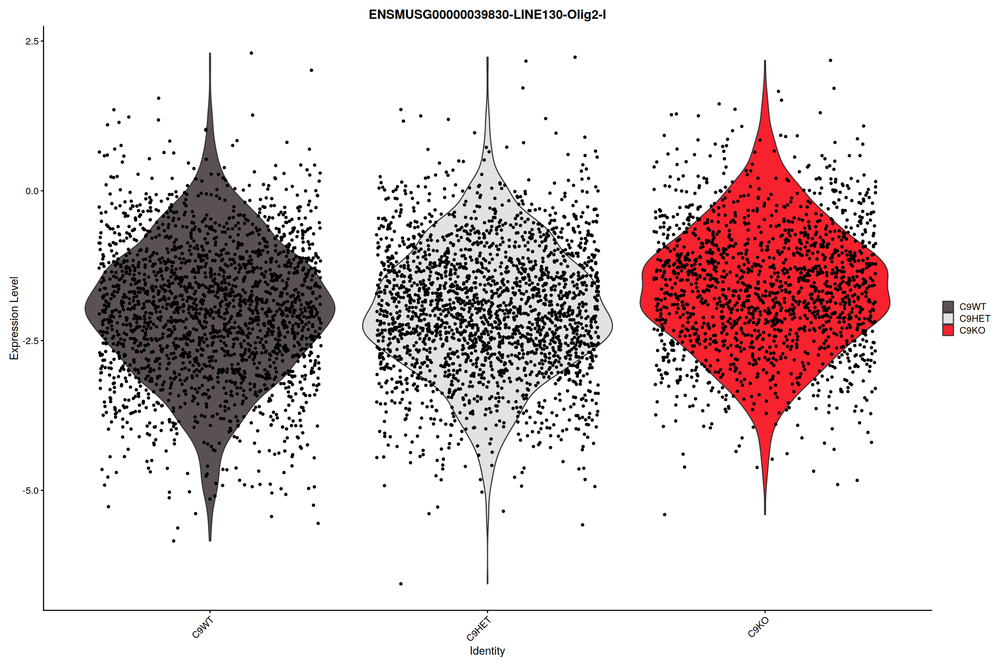

In [34]:
VlnPlot_scCustom(fctx, idents = 'Oligo', features = 'ENSMUSG00000039830-LINE130-Olig2-I', group.by = 'genotype', assay = 'chromvar')

Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"
Warning message in FUN(newX[, i], ...):
"NaNs produced"


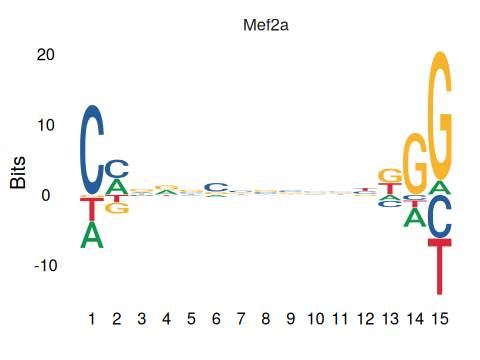

In [40]:
DefaultAssay(fctx) <- 'peaks'
options(repr.plot.width = 4, repr.plot.height = 3)
MotifPlot(fctx, motifs = 'Mef2a')

In [ ]:
dar_fctx <- readRDS('C9Mouse_Frontal_Cortex/DAR/DA_lr_filt_annotated.rds')

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr12-85532271-85533503,3.595865e-17,-1.8296473,0.069,0.262,1.471662e-11
chr10-70598158-70600283,3.952400e-12,1.8881528,0.055,0.020,1.617579e-06
chr4-55740779-55741830,7.952288e-11,-1.5278547,0.074,0.216,3.254593e-05
chr11-6604891-6606603,1.481018e-10,1.4013662,0.069,0.033,6.061286e-05
chr19-5856208-5857866,3.658884e-10,1.4689576,0.066,0.028,1.497453e-04
chr9-50495189-50497061,3.849017e-10,-2.0607683,0.034,0.150,1.575268e-04
chr10-59969545-59970621,4.205252e-10,-1.7915265,0.048,0.179,1.721063e-04
chr17-28517126-28518859,4.424473e-10,-1.1968916,0.131,0.314,1.810782e-04
chr10-59974805-59975020,4.824856e-10,-2.4830623,0.020,0.114,1.974645e-04


: 

In [ ]:
CoveragePlo